In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import lightgbm as lgb
from lightgbm import LGBMRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer

# Overview

The purpose of this notebook was more about learning and experimenting with time series data using a traditional machine learning 
approach to make future predictions.  There were some unique elements to this data that made it a bit challenging to work with.  The initial
challenge was to develop hierarchical modeling solutions such that one set of predictions could be aggregated up to eventually get the overall total sales at the store level (or vice versa, bottom-up vs top down approaches).  For this exercise, I just wanted to refresh myself on doing some time series predictions with an LGBM type of model, mostly to further engrain good CV strategies to handle these types of everyday problems or situations. I ended up generating predictions for just a single store and department (foods dept).  I just chose 
to try and model the Food sales for a single store in CA but I think this could pretty easily be extended to be at the category-store level, which would require training 30 different models (10 stores x 3 departments for each store) and making 30 different sets of predictions.  The different departaments are: Food, Hobbies, and Household items.  More reading about other details of this competition can be found here: https://www.kaggle.com/c/m5-forecasting-accuracy/overview

This competition had two different pieces, one where contestants made predictions and the other was adding prediction errors to those estimates using the specific metric the competition has asked contestants to compute.  It seemed like a pretty complex and hard to understand metric, thus, I did not bother with that here and stuck with the more common and easy to grasp RMSE (root mean squared error).  I think there are reasons they chose the specific error metric but my understanding is that those reasons are also based on hierarchical modeling concepts, which I didn't really apply here. 


# Modeling Strategy

### Features
For the mdoeling strategy, I kept it relatively simple.  I used a few different lag variables.  One interesting note on the lags is that it appeared 
a 28 day sales lag had a pretty strong correlation with the current day sales so that lag variable was used as the main sales lag variable.  We can't use
lags that are more recent because we won't have that information when we go to make predictions.  At least, not without generating dynamic features 
which I did not do here, but one could envision that for each day out you are forecasting from the current day, you generate a new set of lag features 
so you are always using the most recently available data, rather than just a static lag that is the maximum prediction time period. But that seems overly complex and I'm not 100% clear on how that would work in practice.  So for each day in our 28 day prediction window, we'd be using the lag from 28 days prior to that day, regardless of which day in the prediction window it is. Other features used in the model were a holiday indicator (day of, day before and day after), and some rolling means of sales as well.   

Another way of doing this type of modeling would be to modify the outcome variable (y) rather than the indepdent variables or input variables (X).  I did not use this approach here but it is an option. The y's would simply shift back 28 days so that for a given date, you're using the outcome (here, it's sales) from 28 days after time t and trying to predict that. 

### Cross-validation
My cross-validation strategy was also relatively straightforward and I thought it provided a pretty realistic approach for how the model would be used in an actual business environment.  I actually attempted two different CV strategies just to get the practice. The initial strategy was to create a rolling window, using some fixed time period for training, and then made predictions on the next 28 days.  Each fold consisted of 70-80 consecutive days of training data, followed by 28 consecutive days to test the model on.  After making predictions on the first test set in the first fold, it would move to the next fold and do the same thing, each time moving the training window forward in time as well as the prediction window.  The training window was set to a constant size and the prediction window was always 28 days immediately following the end of the training set.

I also attempted to use an expanding window CV strategy to see how this impacted model error.  With this strategy, I started with a small training set and gradually expand it as we move forward in time.  What I discovered is that the model error tended to decrease as we increased the training set size at least once we got past a certain point in the training data size, which was interesting.  I made a few plots to illustrate what this looked like as well further down in the notebook.  I also should point out that there are tradeoffs with this approach, since the window keeps expanding, it requires a lot more resources to run and creates a lot more folds to iterate through making it much more resource intensive.  Running the rolling window took less than a minute to run and get the error metrics for all folds, but the expanding window strategy took about 10 minutes, and this was a relatively small sample of the data, only ~1900 rows total. If you had hundreds of thousands of rows or millions of rows, you'd almost certainly need to run that type of CV in AWS Sagemaker or an equivalent cloud computing resource, assuming you were using nearly all of it for training. 

### Results/Scoring
The model seemed to perform relatively well predicting sales at the store-category level, at least for the store I chose to use.  I used RMSE as the main scoring metric due to its interpretability and was able to achieve an average RMSE of ~300-350 predicting the food sales at the CA_1 store.  Average daily sales in each of the prediction periods was ~3000 items sold.  This was lower than the RMSE of the baseline/naive model where I just used the previous 28 days as the predictions for the next 28 days. That RMSE was around 420. I'm not sure where an RMSE of 350 would rank among all entrants in this competition (probably not super high) but probably not last either.  I was going through some notebooks of those who entered the competition and saw some extremely low RMSEs, some of which seemed almost unbelievable (e.g. RMSEs < 50!). Though, when looking through some of the codes, it wasn't super clear how some of these people were validating their model predictions/error as not everyone posted all of their code. 

In [2]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

In [3]:
#check calendar data first

In [4]:
import os

In [5]:
print(os.getcwd())

/Users/jonsaccount/Python/projects/m5-forecast


In [6]:
os.chdir('/Users/jonsaccount/Documents/Python/m5-forecasting-accuracy')

In [7]:
print(os.getcwd())

/Users/jonsaccount/Documents/Python/m5-forecasting-accuracy


In [8]:
df_calendar = pd.read_csv('calendar.csv')


In [9]:
df_calendar.shape

(1969, 14)

In [10]:
df_calendar.head()

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1


So calendar goes from 1/29/2011 all the way up through the final day (1969), or 2016-06-19.  Will need to do some work on this to make it easier to include in the final model.  We want to give the model the best chance of predicting a 28 day forecast successfully so we need to align this data with the training data somehow.  

It looks like we know if there's a calendar even for any given day 


In [11]:
#Look at sales_train.evaluation

In [12]:
train_eval = pd.read_csv('sales_train_evaluation.csv')

In [13]:
train_eval.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,d_11,d_12,d_13,d_14,d_15,d_16,d_17,d_18,d_19,d_20,d_21,d_22,d_23,d_24,d_25,d_26,d_27,d_28,d_29,d_30,d_31,d_32,d_33,d_34,d_35,d_36,d_37,d_38,d_39,d_40,d_41,d_42,d_43,d_44,d_45,d_46,d_47,d_48,d_49,d_50,d_51,d_52,d_53,d_54,d_55,d_56,d_57,d_58,d_59,d_60,d_61,d_62,d_63,d_64,d_65,d_66,d_67,d_68,d_69,d_70,d_71,d_72,d_73,d_74,d_75,d_76,d_77,d_78,d_79,d_80,d_81,d_82,d_83,d_84,d_85,d_86,d_87,d_88,d_89,d_90,d_91,d_92,d_93,d_94,d_95,d_96,d_97,d_98,d_99,d_100,d_101,d_102,d_103,d_104,d_105,d_106,d_107,d_108,d_109,d_110,d_111,d_112,d_113,d_114,d_115,d_116,d_117,d_118,d_119,d_120,d_121,d_122,d_123,d_124,d_125,d_126,d_127,d_128,d_129,d_130,d_131,d_132,d_133,d_134,d_135,d_136,d_137,d_138,d_139,d_140,d_141,d_142,d_143,d_144,d_145,d_146,d_147,d_148,d_149,d_150,d_151,d_152,d_153,d_154,d_155,d_156,d_157,d_158,d_159,d_160,d_161,d_162,d_163,d_164,d_165,d_166,d_167,d_168,d_169,d_170,d_171,d_172,d_173,d_174,d_175,d_176,d_177,d_178,d_179,d_180,d_181,d_182,d_183,d_184,d_185,d_186,d_187,d_188,d_189,d_190,d_191,d_192,d_193,d_194,d_195,d_196,d_197,d_198,d_199,d_200,d_201,d_202,d_203,d_204,d_205,d_206,d_207,d_208,d_209,d_210,d_211,d_212,d_213,d_214,d_215,d_216,d_217,d_218,d_219,d_220,d_221,d_222,d_223,d_224,d_225,d_226,d_227,d_228,d_229,d_230,d_231,d_232,d_233,d_234,d_235,d_236,d_237,d_238,d_239,d_240,d_241,d_242,d_243,d_244,...,d_1692,d_1693,d_1694,d_1695,d_1696,d_1697,d_1698,d_1699,d_1700,d_1701,d_1702,d_1703,d_1704,d_1705,d_1706,d_1707,d_1708,d_1709,d_1710,d_1711,d_1712,d_1713,d_1714,d_1715,d_1716,d_1717,d_1718,d_1719,d_1720,d_1721,d_1722,d_1723,d_1724,d_1725,d_1726,d_1727,d_1728,d_1729,d_1730,d_1731,d_1732,d_1733,d_1734,d_1735,d_1736,d_1737,d_1738,d_1739,d_1740,d_1741,d_1742,d_1743,d_1744,d_1745,d_1746,d_1747,d_1748,d_1749,d_1750,d_1751,d_1752,d_1753,d_1754,d_1755,d_1756,d_1757,d_1758,d_1759,d_1760,d_1761,d_1762,d_1763,d_1764,d_1765,d_1766,d_1767,d_1768,d_1769,d_1770,d_1771,d_1772,d_1773,d_1774,d_1775,d_1776,d_1777,d_1778,d_1779,d_1780,d_1781,d_1782,d_1783,d_1784,d_1785,d_1786,d_1787,d_1788,d_1789,d_1790,d_1791,d_1792,d_1793,d_1794,d_1795,d_1796,d_1797,d_1798,d_1799,d_1800,d_1801,d_1802,d_1803,d_1804,d_1805,d_1806,d_1807,d_1808,d_1809,d_1810,d_1811,d_1812,d_1813,d_1814,d_1815,d_1816,d_1817,d_1818,d_1819,d_1820,d_1821,d_1822,d_1823,d_1824,d_1825,d_1826,d_1827,d_1828,d_1829,d_1830,d_1831,d_1832,d_1833,d_1834,d_1835,d_1836,d_1837,d_1838,d_1839,d_1840,d_1841,d_1842,d_1843,d_1844,d_1845,d_1846,d_1847,d_1848,d_1849,d_1850,d_1851,d_1852,d_1853,d_1854,d_1855,d_1856,d_1857,d_1858,d_1859,d_1860,d_1861,d_1862,d_1863,d_1864,d_1865,d_1866,d_1867,d_1868,d_1869,d_1870,d_1871,d_1872,d_1873,d_1874,d_1875,d_1876,d_1877,d_1878,d_1879,d_1880,d_1881,d_1882,d_1883,d_1884,d_1885,d_1886,d_1887,d_1888,d_1889,d_1890,d_1891,d_1892,d_1893,d_1894,d_1895,d_1896,d_1897,d_1898,d_1899,d_1900,d_1901,d_1902,d_1903,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913,d_1914,d_1915,d_1916,d_1917,d_1918,d_1919,d_1920,d_1921,d_1922,d_1923,d_1924,d_1925,d_1926,d_1927,d_1928,d_1929,d_1930,d_1931,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2,0,0,0,0,0,0,0,1,0,1,0,1,0,3,1,1,0,1,1,2,0,0,0,0,1,1,0,0,0,0,3,0,1,0,0,0,0,1,1,1,0,1,0,2,0,0,0,0,2,0,0,0,0,1,1,2,0,0,0,0,2,0,0,1,1,1,1,0,0,0,0,0,1,2,2,0,1,0,0,0,0,1,2,1,0,0,0,0,0,1,0,3,0,1,2,1,0,3,0,0,0,1,0,2,2,1,0,0,1,2,0,1,0,1,4,0,0,5,0,0,0,0,0,0,2,1,2,1,0,0,0,1,1,1,0,0,1,1,1,1

In [14]:
train_eval.tail()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,d_11,d_12,d_13,d_14,d_15,d_16,d_17,d_18,d_19,d_20,d_21,d_22,d_23,d_24,d_25,d_26,d_27,d_28,d_29,d_30,d_31,d_32,d_33,d_34,d_35,d_36,d_37,d_38,d_39,d_40,d_41,d_42,d_43,d_44,d_45,d_46,d_47,d_48,d_49,d_50,d_51,d_52,d_53,d_54,d_55,d_56,d_57,d_58,d_59,d_60,d_61,d_62,d_63,d_64,d_65,d_66,d_67,d_68,d_69,d_70,d_71,d_72,d_73,d_74,d_75,d_76,d_77,d_78,d_79,d_80,d_81,d_82,d_83,d_84,d_85,d_86,d_87,d_88,d_89,d_90,d_91,d_92,d_93,d_94,d_95,d_96,d_97,d_98,d_99,d_100,d_101,d_102,d_103,d_104,d_105,d_106,d_107,d_108,d_109,d_110,d_111,d_112,d_113,d_114,d_115,d_116,d_117,d_118,d_119,d_120,d_121,d_122,d_123,d_124,d_125,d_126,d_127,d_128,d_129,d_130,d_131,d_132,d_133,d_134,d_135,d_136,d_137,d_138,d_139,d_140,d_141,d_142,d_143,d_144,d_145,d_146,d_147,d_148,d_149,d_150,d_151,d_152,d_153,d_154,d_155,d_156,d_157,d_158,d_159,d_160,d_161,d_162,d_163,d_164,d_165,d_166,d_167,d_168,d_169,d_170,d_171,d_172,d_173,d_174,d_175,d_176,d_177,d_178,d_179,d_180,d_181,d_182,d_183,d_184,d_185,d_186,d_187,d_188,d_189,d_190,d_191,d_192,d_193,d_194,d_195,d_196,d_197,d_198,d_199,d_200,d_201,d_202,d_203,d_204,d_205,d_206,d_207,d_208,d_209,d_210,d_211,d_212,d_213,d_214,d_215,d_216,d_217,d_218,d_219,d_220,d_221,d_222,d_223,d_224,d_225,d_226,d_227,d_228,d_229,d_230,d_231,d_232,d_233,d_234,d_235,d_236,d_237,d_238,d_239,d_240,d_241,d_242,d_243,d_244,...,d_1692,d_1693,d_1694,d_1695,d_1696,d_1697,d_1698,d_1699,d_1700,d_1701,d_1702,d_1703,d_1704,d_1705,d_1706,d_1707,d_1708,d_1709,d_1710,d_1711,d_1712,d_1713,d_1714,d_1715,d_1716,d_1717,d_1718,d_1719,d_1720,d_1721,d_1722,d_1723,d_1724,d_1725,d_1726,d_1727,d_1728,d_1729,d_1730,d_1731,d_1732,d_1733,d_1734,d_1735,d_1736,d_1737,d_1738,d_1739,d_1740,d_1741,d_1742,d_1743,d_1744,d_1745,d_1746,d_1747,d_1748,d_1749,d_1750,d_1751,d_1752,d_1753,d_1754,d_1755,d_1756,d_1757,d_1758,d_1759,d_1760,d_1761,d_1762,d_1763,d_1764,d_1765,d_1766,d_1767,d_1768,d_1769,d_1770,d_1771,d_1772,d_1773,d_1774,d_1775,d_1776,d_1777,d_1778,d_1779,d_1780,d_1781,d_1782,d_1783,d_1784,d_1785,d_1786,d_1787,d_1788,d_1789,d_1790,d_1791,d_1792,d_1793,d_1794,d_1795,d_1796,d_1797,d_1798,d_1799,d_1800,d_1801,d_1802,d_1803,d_1804,d_1805,d_1806,d_1807,d_1808,d_1809,d_1810,d_1811,d_1812,d_1813,d_1814,d_1815,d_1816,d_1817,d_1818,d_1819,d_1820,d_1821,d_1822,d_1823,d_1824,d_1825,d_1826,d_1827,d_1828,d_1829,d_1830,d_1831,d_1832,d_1833,d_1834,d_1835,d_1836,d_1837,d_1838,d_1839,d_1840,d_1841,d_1842,d_1843,d_1844,d_1845,d_1846,d_1847,d_1848,d_1849,d_1850,d_1851,d_1852,d_1853,d_1854,d_1855,d_1856,d_1857,d_1858,d_1859,d_1860,d_1861,d_1862,d_1863,d_1864,d_1865,d_1866,d_1867,d_1868,d_1869,d_1870,d_1871,d_1872,d_1873,d_1874,d_1875,d_1876,d_1877,d_1878,d_1879,d_1880,d_1881,d_1882,d_1883,d_1884,d_1885,d_1886,d_1887,d_1888,d_1889,d_1890,d_1891,d_1892,d_1893,d_1894,d_1895,d_1896,d_1897,d_1898,d_1899,d_1900,d_1901,d_1902,d_1903,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913,d_1914,d_1915,d_1916,d_1917,d_1918,d_1919,d_1920,d_1921,d_1922,d_1923,d_1924,d_1925,d_1926,d_1927,d_1928,d_1929,d_1930,d_1931,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941
30485,FOODS_3_823_WI_3_evaluation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,0,0,2,2,0,3,1,4,1,0,0,3,4,4,0,0,1,0,1,1,7,7,3,6,3,3,7,12,4,2,7,5,12,5,3,3,7,6,4,6,3,6,2,3,4,1,1,3,2,1,2,3,4,7,2,4,4,4,7,7,2,4,7,4,4,7,3,4,2,3,10,6,8,5,1,0,2,1,0,3,0,2,3,1,1,1,7,1,4,2,2,0,0,0,5,1,1,3,1,6,6,3,4,3,2,2,1,2,2,1,1,0,0,0,2,3,1,0,1,1,1,1,1,3,0,0,1,2,1,0,1,3,1,2,2,0,3,2,1,0,0,1,2,0,0,0,0,0,2,0,2,0,1,2,1,1,0,0,2,1,1,0,1,1,2,1,3,1,0,2,0,0,0,1,0,1,0,1,1,0,2,0,0,2,1,0,1,0,1,1,1,0,3,0,1,0,1,2,3,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,1,1,0,5,1,0,1,0,0,1,0,1,0,1,1,1,2,1,2,0,1,0,0,1,2,2,2,0,0,1,...,1,0,1,0,1,0,1,0,0,1,1,0,1,0,2,1,0,0,1,0,0,1,0,0,4,1,5,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,1,2,1,0,0,0,0,0,3,1,1,1,0,0,1,0,1,2,1,0,0,2,0,2,1,0,1,1,0,1,2,0,1,0,1,0,0,2,0,1,1,0,3,0,0,1,1,3,3,1,0,0,0,1,2,3,0,0,0,1,0,2,1,1,0,0,4,0,6,1,0,1,0,0,0,1,1,0,0,0,0,0,1,0,2,0,1,0,0,3,1,1,0,0,0,2,3,

In [15]:
train_val = pd.read_csv('sales_train_validation.csv')

In [16]:
train_val.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,d_11,d_12,d_13,d_14,d_15,d_16,d_17,d_18,d_19,d_20,d_21,d_22,d_23,d_24,d_25,d_26,d_27,d_28,d_29,d_30,d_31,d_32,d_33,d_34,d_35,d_36,d_37,d_38,d_39,d_40,d_41,d_42,d_43,d_44,d_45,d_46,d_47,d_48,d_49,d_50,d_51,d_52,d_53,d_54,d_55,d_56,d_57,d_58,d_59,d_60,d_61,d_62,d_63,d_64,d_65,d_66,d_67,d_68,d_69,d_70,d_71,d_72,d_73,d_74,d_75,d_76,d_77,d_78,d_79,d_80,d_81,d_82,d_83,d_84,d_85,d_86,d_87,d_88,d_89,d_90,d_91,d_92,d_93,d_94,d_95,d_96,d_97,d_98,d_99,d_100,d_101,d_102,d_103,d_104,d_105,d_106,d_107,d_108,d_109,d_110,d_111,d_112,d_113,d_114,d_115,d_116,d_117,d_118,d_119,d_120,d_121,d_122,d_123,d_124,d_125,d_126,d_127,d_128,d_129,d_130,d_131,d_132,d_133,d_134,d_135,d_136,d_137,d_138,d_139,d_140,d_141,d_142,d_143,d_144,d_145,d_146,d_147,d_148,d_149,d_150,d_151,d_152,d_153,d_154,d_155,d_156,d_157,d_158,d_159,d_160,d_161,d_162,d_163,d_164,d_165,d_166,d_167,d_168,d_169,d_170,d_171,d_172,d_173,d_174,d_175,d_176,d_177,d_178,d_179,d_180,d_181,d_182,d_183,d_184,d_185,d_186,d_187,d_188,d_189,d_190,d_191,d_192,d_193,d_194,d_195,d_196,d_197,d_198,d_199,d_200,d_201,d_202,d_203,d_204,d_205,d_206,d_207,d_208,d_209,d_210,d_211,d_212,d_213,d_214,d_215,d_216,d_217,d_218,d_219,d_220,d_221,d_222,d_223,d_224,d_225,d_226,d_227,d_228,d_229,d_230,d_231,d_232,d_233,d_234,d_235,d_236,d_237,d_238,d_239,d_240,d_241,d_242,d_243,d_244,...,d_1664,d_1665,d_1666,d_1667,d_1668,d_1669,d_1670,d_1671,d_1672,d_1673,d_1674,d_1675,d_1676,d_1677,d_1678,d_1679,d_1680,d_1681,d_1682,d_1683,d_1684,d_1685,d_1686,d_1687,d_1688,d_1689,d_1690,d_1691,d_1692,d_1693,d_1694,d_1695,d_1696,d_1697,d_1698,d_1699,d_1700,d_1701,d_1702,d_1703,d_1704,d_1705,d_1706,d_1707,d_1708,d_1709,d_1710,d_1711,d_1712,d_1713,d_1714,d_1715,d_1716,d_1717,d_1718,d_1719,d_1720,d_1721,d_1722,d_1723,d_1724,d_1725,d_1726,d_1727,d_1728,d_1729,d_1730,d_1731,d_1732,d_1733,d_1734,d_1735,d_1736,d_1737,d_1738,d_1739,d_1740,d_1741,d_1742,d_1743,d_1744,d_1745,d_1746,d_1747,d_1748,d_1749,d_1750,d_1751,d_1752,d_1753,d_1754,d_1755,d_1756,d_1757,d_1758,d_1759,d_1760,d_1761,d_1762,d_1763,d_1764,d_1765,d_1766,d_1767,d_1768,d_1769,d_1770,d_1771,d_1772,d_1773,d_1774,d_1775,d_1776,d_1777,d_1778,d_1779,d_1780,d_1781,d_1782,d_1783,d_1784,d_1785,d_1786,d_1787,d_1788,d_1789,d_1790,d_1791,d_1792,d_1793,d_1794,d_1795,d_1796,d_1797,d_1798,d_1799,d_1800,d_1801,d_1802,d_1803,d_1804,d_1805,d_1806,d_1807,d_1808,d_1809,d_1810,d_1811,d_1812,d_1813,d_1814,d_1815,d_1816,d_1817,d_1818,d_1819,d_1820,d_1821,d_1822,d_1823,d_1824,d_1825,d_1826,d_1827,d_1828,d_1829,d_1830,d_1831,d_1832,d_1833,d_1834,d_1835,d_1836,d_1837,d_1838,d_1839,d_1840,d_1841,d_1842,d_1843,d_1844,d_1845,d_1846,d_1847,d_1848,d_1849,d_1850,d_1851,d_1852,d_1853,d_1854,d_1855,d_1856,d_1857,d_1858,d_1859,d_1860,d_1861,d_1862,d_1863,d_1864,d_1865,d_1866,d_1867,d_1868,d_1869,d_1870,d_1871,d_1872,d_1873,d_1874,d_1875,d_1876,d_1877,d_1878,d_1879,d_1880,d_1881,d_1882,d_1883,d_1884,d_1885,d_1886,d_1887,d_1888,d_1889,d_1890,d_1891,d_1892,d_1893,d_1894,d_1895,d_1896,d_1897,d_1898,d_1899,d_1900,d_1901,d_1902,d_1903,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,2,0,2,2,0,0,0,1,1,0,2,0,1,1,2,0,1,0,0,0,2,1,0,1,1,2,0,0,0,0,0,0,0,1,0,1,0,1,0,3,1,1,0,1,1,2,0,0,0,0,1,1,0,0,0,0,3,0,1,0,0,0,0,1,1,1,0,1,0,2,0,0,0,0,2,0,0,0,0,1,1,2,0,0,0,0,2,0,0,1,1,1,1,0,0,0,0,0,1,2,2,0,1,0,0,0,0,1,2,1,0,0,0,0,0,1,0,3,0,1,2,1,0,3,0,0,0,1,0,2,2,1,0,0,1,2,0,1

In [17]:
train_val.tail()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,d_11,d_12,d_13,d_14,d_15,d_16,d_17,d_18,d_19,d_20,d_21,d_22,d_23,d_24,d_25,d_26,d_27,d_28,d_29,d_30,d_31,d_32,d_33,d_34,d_35,d_36,d_37,d_38,d_39,d_40,d_41,d_42,d_43,d_44,d_45,d_46,d_47,d_48,d_49,d_50,d_51,d_52,d_53,d_54,d_55,d_56,d_57,d_58,d_59,d_60,d_61,d_62,d_63,d_64,d_65,d_66,d_67,d_68,d_69,d_70,d_71,d_72,d_73,d_74,d_75,d_76,d_77,d_78,d_79,d_80,d_81,d_82,d_83,d_84,d_85,d_86,d_87,d_88,d_89,d_90,d_91,d_92,d_93,d_94,d_95,d_96,d_97,d_98,d_99,d_100,d_101,d_102,d_103,d_104,d_105,d_106,d_107,d_108,d_109,d_110,d_111,d_112,d_113,d_114,d_115,d_116,d_117,d_118,d_119,d_120,d_121,d_122,d_123,d_124,d_125,d_126,d_127,d_128,d_129,d_130,d_131,d_132,d_133,d_134,d_135,d_136,d_137,d_138,d_139,d_140,d_141,d_142,d_143,d_144,d_145,d_146,d_147,d_148,d_149,d_150,d_151,d_152,d_153,d_154,d_155,d_156,d_157,d_158,d_159,d_160,d_161,d_162,d_163,d_164,d_165,d_166,d_167,d_168,d_169,d_170,d_171,d_172,d_173,d_174,d_175,d_176,d_177,d_178,d_179,d_180,d_181,d_182,d_183,d_184,d_185,d_186,d_187,d_188,d_189,d_190,d_191,d_192,d_193,d_194,d_195,d_196,d_197,d_198,d_199,d_200,d_201,d_202,d_203,d_204,d_205,d_206,d_207,d_208,d_209,d_210,d_211,d_212,d_213,d_214,d_215,d_216,d_217,d_218,d_219,d_220,d_221,d_222,d_223,d_224,d_225,d_226,d_227,d_228,d_229,d_230,d_231,d_232,d_233,d_234,d_235,d_236,d_237,d_238,d_239,d_240,d_241,d_242,d_243,d_244,...,d_1664,d_1665,d_1666,d_1667,d_1668,d_1669,d_1670,d_1671,d_1672,d_1673,d_1674,d_1675,d_1676,d_1677,d_1678,d_1679,d_1680,d_1681,d_1682,d_1683,d_1684,d_1685,d_1686,d_1687,d_1688,d_1689,d_1690,d_1691,d_1692,d_1693,d_1694,d_1695,d_1696,d_1697,d_1698,d_1699,d_1700,d_1701,d_1702,d_1703,d_1704,d_1705,d_1706,d_1707,d_1708,d_1709,d_1710,d_1711,d_1712,d_1713,d_1714,d_1715,d_1716,d_1717,d_1718,d_1719,d_1720,d_1721,d_1722,d_1723,d_1724,d_1725,d_1726,d_1727,d_1728,d_1729,d_1730,d_1731,d_1732,d_1733,d_1734,d_1735,d_1736,d_1737,d_1738,d_1739,d_1740,d_1741,d_1742,d_1743,d_1744,d_1745,d_1746,d_1747,d_1748,d_1749,d_1750,d_1751,d_1752,d_1753,d_1754,d_1755,d_1756,d_1757,d_1758,d_1759,d_1760,d_1761,d_1762,d_1763,d_1764,d_1765,d_1766,d_1767,d_1768,d_1769,d_1770,d_1771,d_1772,d_1773,d_1774,d_1775,d_1776,d_1777,d_1778,d_1779,d_1780,d_1781,d_1782,d_1783,d_1784,d_1785,d_1786,d_1787,d_1788,d_1789,d_1790,d_1791,d_1792,d_1793,d_1794,d_1795,d_1796,d_1797,d_1798,d_1799,d_1800,d_1801,d_1802,d_1803,d_1804,d_1805,d_1806,d_1807,d_1808,d_1809,d_1810,d_1811,d_1812,d_1813,d_1814,d_1815,d_1816,d_1817,d_1818,d_1819,d_1820,d_1821,d_1822,d_1823,d_1824,d_1825,d_1826,d_1827,d_1828,d_1829,d_1830,d_1831,d_1832,d_1833,d_1834,d_1835,d_1836,d_1837,d_1838,d_1839,d_1840,d_1841,d_1842,d_1843,d_1844,d_1845,d_1846,d_1847,d_1848,d_1849,d_1850,d_1851,d_1852,d_1853,d_1854,d_1855,d_1856,d_1857,d_1858,d_1859,d_1860,d_1861,d_1862,d_1863,d_1864,d_1865,d_1866,d_1867,d_1868,d_1869,d_1870,d_1871,d_1872,d_1873,d_1874,d_1875,d_1876,d_1877,d_1878,d_1879,d_1880,d_1881,d_1882,d_1883,d_1884,d_1885,d_1886,d_1887,d_1888,d_1889,d_1890,d_1891,d_1892,d_1893,d_1894,d_1895,d_1896,d_1897,d_1898,d_1899,d_1900,d_1901,d_1902,d_1903,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
30485,FOODS_3_823_WI_3_validation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,0,0,2,2,0,3,1,4,1,0,0,3,4,4,0,0,1,0,1,1,7,7,3,6,3,3,7,12,4,2,7,5,12,5,3,3,7,6,4,6,3,6,2,3,4,1,1,3,2,1,2,3,4,7,2,4,4,4,7,7,2,4,7,4,4,7,3,4,2,3,10,6,8,5,1,0,2,1,0,3,0,2,3,1,1,1,7,1,4,2,2,0,0,0,5,1,1,3,1,6,6,3,4,3,2,2,1,2,2,1,1,0,0,0,2,3,1,0,1,1,1,1,1,3,0,0,1,2,1,0,1,3,1,2,2,0,3,2,1,0,0,1,2,0,0,0,0,0,2,0,2,0,1,2,1,1,0,0,2,1,1,0,1,1,2,1,3,1,0,2,0,0,0,1,0,1,0,1,1,0,2,0,0,2,1,0,1,0,1,1,1,0,3,0,1,0,1,2,3,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,1,1,0,5,1,0,1,0,0,1,0,1,0,1,1,1,2,1,2,0,1,0,0,1,2,2,2,0,0,1,...,1,0,2,1,0,1,0,2,0,0,1,2,0,2,0,0,0,1,1,1,0,0,1,1,0,2,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,2,1,0,0,1,0,0,1,0,0,4,1,5,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,1,2,1,0,0,0,0,0,3,1,1,1,0,0,1,0,1,2,1,0,0,2,0,2,1,0,1,1,0,1,2,0,1,0,1,0,0,2,0,1,1,0,3,0,0,1,1,3,3,1,0,0,0,1,2,3,0,0,0,1,0,2,1,1,0,0,4,0,6,

In [18]:
#Price will certainly play an important role in developing a good model.  Make a few plots

prices_df = pd.read_csv('sell_prices.csv')

In [19]:
prices_df.head()

,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58
2,CA_1,HOBBIES_1_001,11327,8.26
3,CA_1,HOBBIES_1_001,11328,8.26
4,CA_1,HOBBIES_1_001,11329,8.26


In [20]:
prices_df.shape

(6841121, 4)

In [21]:
train_val.cat_id.unique()

array(['HOBBIES', 'HOUSEHOLD', 'FOODS'], dtype=object)

In [22]:
#Examine some data

nulls_train_val = train_val.isna().sum()
nulls_train_val[nulls_train_val>0]

Series([], dtype: int64)

In [23]:
nulls_calendar = df_calendar.isna().sum()
nulls_calendar[nulls_calendar > 0]

event_name_1    1807
event_type_1    1807
event_name_2    1964
event_type_2    1964
dtype: int64

In [24]:
#We should try to join the calendar/dates to our sales data to make some plots over time

date_cols = pd.DataFrame([i for i in train_val.columns if 'd_' in i]).rename(index=str, columns={0:'date_d'})

#Convert training data from wide to long first
train_val_dff = pd.melt(train_val, id_vars = ['id', 'store_id', 'item_id', 'dept_id', 'cat_id', 'state_id'], var_name='date', value_name='sales')

train_val_dff.head()

,id,store_id,item_id,dept_id,cat_id,state_id,date,sales
0,HOBBIES_1_001_CA_1_validation,CA_1,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA,d_1,0
1,HOBBIES_1_002_CA_1_validation,CA_1,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA,d_1,0
2,HOBBIES_1_003_CA_1_validation,CA_1,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA,d_1,0
3,HOBBIES_1_004_CA_1_validation,CA_1,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA,d_1,0
4,HOBBIES_1_005_CA_1_validation,CA_1,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA,d_1,0


In [25]:
#now we can join back to the calendar data on the date field to get actual dates

In [26]:
main_df = pd.merge(train_val_dff, df_calendar, how='left', left_on='date', right_on='d', suffixes=('', '_drop'))

#Also bring in price data, which looks like we'll need to join on store_id, item_id and the wm_yr_wk field
main_df = pd.merge(main_df, prices_df, how='left', on=['store_id', 'item_id', 'wm_yr_wk'], suffixes=('', '_drop'))

main_df.shape

(58327370, 23)

In [27]:
main_df.head()

,id,store_id,item_id,dept_id,cat_id,state_id,date,sales,date_drop,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,sell_price
0,HOBBIES_1_001_CA_1_validation,CA_1,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0,NaN
1,HOBBIES_1_002_CA_1_validation,CA_1,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0,NaN
2,HOBBIES_1_003_CA_1_validation,CA_1,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0,NaN
3,HOBBIES_1_004_CA_1_validation,CA_1,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0,NaN
4,HOBBIES_1_005_CA_1_validation,CA_1,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0,NaN


In [28]:
#Rename a column

main_df = main_df.rename(index=str, columns={'date':'day_int', 
                                             'date_drop':'date'
                                            })

main_df.head()

,id,store_id,item_id,dept_id,cat_id,state_id,day_int,sales,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,sell_price
0,HOBBIES_1_001_CA_1_validation,CA_1,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0,NaN
1,HOBBIES_1_002_CA_1_validation,CA_1,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0,NaN
2,HOBBIES_1_003_CA_1_validation,CA_1,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0,NaN
3,HOBBIES_1_004_CA_1_validation,CA_1,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0,NaN
4,HOBBIES_1_005_CA_1_validation,CA_1,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0,NaN


In [29]:
#So sell price has missing values.  This may not be a huge issue as this will likely be a rolling mean type of feature.  In other words, when we make
#predictions on our test data, we're only going to know what the past price points are so we'll need to use that to try and enhance the forward looking forecast of sales.

main_df['sell_price'].describe()

count    4.602796e+07
mean     4.408089e+00
std      3.403657e+00
min      1.000000e-02
25%      2.180000e+00
50%      3.470000e+00
75%      5.840000e+00
max      1.073200e+02
Name: sell_price, dtype: float64

In [30]:
df_sales = main_df.copy()

In [31]:
#Look at sales by store_id

sales_store = df_sales.pivot_table(index='store_id', columns='date', values='sales', aggfunc=np.sum)

sales_store

/var/folders/tb/tcyvmh0x1457_fgm58t3gh640000gn/T/ipykernel_19176/1746039786.py:3: FutureWarning: The provided callable <function sum at 0x10f1fd2d0> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  sales_store = df_sales.pivot_table(index='store_id', columns='date', values='sales', aggfunc=np.sum)


date,2011-01-29,2011-01-30,2011-01-31,2011-02-01,2011-02-02,2011-02-03,2011-02-04,2011-02-05,2011-02-06,2011-02-07,2011-02-08,2011-02-09,2011-02-10,2011-02-11,2011-02-12,2011-02-13,2011-02-14,2011-02-15,2011-02-16,2011-02-17,2011-02-18,2011-02-19,2011-02-20,2011-02-21,2011-02-22,2011-02-23,2011-02-24,2011-02-25,2011-02-26,2011-02-27,2011-02-28,2011-03-01,2011-03-02,2011-03-03,2011-03-04,2011-03-05,2011-03-06,2011-03-07,2011-03-08,2011-03-09,2011-03-10,2011-03-11,2011-03-12,2011-03-13,2011-03-14,2011-03-15,2011-03-16,2011-03-17,2011-03-18,2011-03-19,2011-03-20,2011-03-21,2011-03-22,2011-03-23,2011-03-24,2011-03-25,2011-03-26,2011-03-27,2011-03-28,2011-03-29,2011-03-30,2011-03-31,2011-04-01,2011-04-02,2011-04-03,2011-04-04,2011-04-05,2011-04-06,2011-04-07,2011-04-08,2011-04-09,2011-04-10,2011-04-11,2011-04-12,2011-04-13,2011-04-14,2011-04-15,2011-04-16,2011-04-17,2011-04-18,2011-04-19,2011-04-20,2011-04-21,2011-04-22,2011-04-23,2011-04-24,2011-04-25,2011-04-26,2011-04-27,2011-04-28,2011-04-29,2011-04-30,2011-05-01,2011-05-02,2011-05-03,2011-05-04,2011-05-05,2011-05-06,2011-05-07,2011-05-08,2011-05-09,2011-05-10,2011-05-11,2011-05-12,2011-05-13,2011-05-14,2011-05-15,2011-05-16,2011-05-17,2011-05-18,2011-05-19,2011-05-20,2011-05-21,2011-05-22,2011-05-23,2011-05-24,2011-05-25,2011-05-26,2011-05-27,2011-05-28,2011-05-29,2011-05-30,2011-05-31,2011-06-01,2011-06-02,2011-06-03,2011-06-04,2011-06-05,2011-06-06,2011-06-07,2011-06-08,2011-06-09,2011-06-10,2011-06-11,2011-06-12,2011-06-13,2011-06-14,2011-06-15,2011-06-16,2011-06-17,2011-06-18,2011-06-19,2011-06-20,2011-06-21,2011-06-22,2011-06-23,2011-06-24,2011-06-25,2011-06-26,2011-06-27,2011-06-28,2011-06-29,2011-06-30,2011-07-01,2011-07-02,2011-07-03,2011-07-04,2011-07-05,2011-07-06,2011-07-07,2011-07-08,2011-07-09,2011-07-10,2011-07-11,2011-07-12,2011-07-13,2011-07-14,2011-07-15,2011-07-16,2011-07-17,2011-07-18,2011-07-19,2011-07-20,2011-07-21,2011-07-22,2011-07-23,2011-07-24,2011-07-25,2011-07-26,2011-07-27,2011-07-28,2011-07-29,2011-07-30,2011-07-31,2011-08-01,2011-08-02,2011-08-03,2011-08-04,2011-08-05,2011-08-06,2011-08-07,2011-08-08,2011-08-09,2011-08-10,2011-08-11,2011-08-12,2011-08-13,2011-08-14,2011-08-15,2011-08-16,2011-08-17,2011-08-18,2011-08-19,2011-08-20,2011-08-21,2011-08-22,2011-08-23,2011-08-24,2011-08-25,2011-08-26,2011-08-27,2011-08-28,2011-08-29,2011-08-30,2011-08-31,2011-09-01,2011-09-02,2011-09-03,2011-09-04,2011-09-05,2011-09-06,2011-09-07,2011-09-08,2011-09-09,2011-09-10,2011-09-11,2011-09-12,2011-09-13,2011-09-14,2011-09-15,2011-09-16,2011-09-17,2011-09-18,2011-09-19,2011-09-20,2011-09-21,2011-09-22,2011-09-23,2011-09-24,2011-09-25,2011-09-26,2011-09-27,2011-09-28,2011-09-29,2011-09-30,2011-10-01,2011-10-02,2011-10-03,2011-10-04,2011-10-05,...,2015-08-19,2015-08-20,2015-08-21,2015-08-22,2015-08-23,2015-08-24,2015-08-25,2015-08-26,2015-08-27,2015-08-28,2015-08-29,2015-08-30,2015-08-31,2015-09-01,2015-09-02,2015-09-03,2015-09-04,2015-09-05,2015-09-06,2015-09-07,2015-09-08,2015-09-09,2015-09-10,2015-09-11,2015-09-12,2015-09-13,2015-09-14,2015-09-15,2015-09-16,2015-09-17,2015-09-18,2015-09-19,2015-09-20,2015-09-21,2015-09-22,2015-09-23,2015-09-24,2015-09-25,2015-09-26,2015-09-27,2015-09-28,2015-09-29,2015-09-30,2015-10-01,2015-10-02,2015-10-03,2015-10-04,2015-10-05,2015-10-06,2015-10-07,2015-10-08,2015-10-09,2015-10-10,2015-10-11,2015-10-12,2015-10-13,2015-10-14,2015-10-15,2015-10-16,2015-10-17,2015-10-18,2015-10-19,2015-10-20,2015-10-21,2015-10-22,2015-10-23,2015-10-24,2015-10-25,2015-10-26,2015-10-27,2015-10-28,2015-10-29,2015-10-30,2015-10-31,2015-11-01,2015-11-02,2015-11-03,2015-11-04,2015-11-05,2015-11-06,2015-11-07,2015-11-08,2015-11-09,2015-11-10,2015-11-11,2015-11-12,2015-11-13,2015-11-14,2015-11-15,2015-11-16,2015-11-17,2015-11-18,2015-11-19,2015-11-20,2015-11-21,2015-11-22,2015-11-23,2015-11-24,2015-11-25,2015-11-26,2015-11-27,2015-11-28,2015-11-29,2015-11-30,2015-12-01,2015-12-02,2015-12-03,2015-12-04,2015-12-05,2015-12-06,2015-12-07,2015-12-08,2015-12-0

In [32]:
#Because this data is so big, I'm going to filter to just CA and just the food category and try to model that.  

#This is more to learn about time series and practive different modeling strategies to get forecasts.  Hopefully we can get a fairly accurate model!

df_sample = df_sales[(df_sales['state_id']=='CA') & (df_sales['cat_id']=='FOODS')]

df_sample.shape

(10995924, 23)

In [33]:
del df_sales
del main_df

In [34]:
#Look at total sales by store
sales_store = df_sample.pivot_table(index='store_id', columns='date', values='sales', aggfunc=np.sum)

sales_store


/var/folders/tb/tcyvmh0x1457_fgm58t3gh640000gn/T/ipykernel_19176/3864745680.py:2: FutureWarning: The provided callable <function sum at 0x10f1fd2d0> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  sales_store = df_sample.pivot_table(index='store_id', columns='date', values='sales', aggfunc=np.sum)


date,2011-01-29,2011-01-30,2011-01-31,2011-02-01,2011-02-02,2011-02-03,2011-02-04,2011-02-05,2011-02-06,2011-02-07,2011-02-08,2011-02-09,2011-02-10,2011-02-11,2011-02-12,2011-02-13,2011-02-14,2011-02-15,2011-02-16,2011-02-17,2011-02-18,2011-02-19,2011-02-20,2011-02-21,2011-02-22,2011-02-23,2011-02-24,2011-02-25,2011-02-26,2011-02-27,2011-02-28,2011-03-01,2011-03-02,2011-03-03,2011-03-04,2011-03-05,2011-03-06,2011-03-07,2011-03-08,2011-03-09,2011-03-10,2011-03-11,2011-03-12,2011-03-13,2011-03-14,2011-03-15,2011-03-16,2011-03-17,2011-03-18,2011-03-19,2011-03-20,2011-03-21,2011-03-22,2011-03-23,2011-03-24,2011-03-25,2011-03-26,2011-03-27,2011-03-28,2011-03-29,2011-03-30,2011-03-31,2011-04-01,2011-04-02,2011-04-03,2011-04-04,2011-04-05,2011-04-06,2011-04-07,2011-04-08,2011-04-09,2011-04-10,2011-04-11,2011-04-12,2011-04-13,2011-04-14,2011-04-15,2011-04-16,2011-04-17,2011-04-18,2011-04-19,2011-04-20,2011-04-21,2011-04-22,2011-04-23,2011-04-24,2011-04-25,2011-04-26,2011-04-27,2011-04-28,2011-04-29,2011-04-30,2011-05-01,2011-05-02,2011-05-03,2011-05-04,2011-05-05,2011-05-06,2011-05-07,2011-05-08,2011-05-09,2011-05-10,2011-05-11,2011-05-12,2011-05-13,2011-05-14,2011-05-15,2011-05-16,2011-05-17,2011-05-18,2011-05-19,2011-05-20,2011-05-21,2011-05-22,2011-05-23,2011-05-24,2011-05-25,2011-05-26,2011-05-27,2011-05-28,2011-05-29,2011-05-30,2011-05-31,2011-06-01,2011-06-02,2011-06-03,2011-06-04,2011-06-05,2011-06-06,2011-06-07,2011-06-08,2011-06-09,2011-06-10,2011-06-11,2011-06-12,2011-06-13,2011-06-14,2011-06-15,2011-06-16,2011-06-17,2011-06-18,2011-06-19,2011-06-20,2011-06-21,2011-06-22,2011-06-23,2011-06-24,2011-06-25,2011-06-26,2011-06-27,2011-06-28,2011-06-29,2011-06-30,2011-07-01,2011-07-02,2011-07-03,2011-07-04,2011-07-05,2011-07-06,2011-07-07,2011-07-08,2011-07-09,2011-07-10,2011-07-11,2011-07-12,2011-07-13,2011-07-14,2011-07-15,2011-07-16,2011-07-17,2011-07-18,2011-07-19,2011-07-20,2011-07-21,2011-07-22,2011-07-23,2011-07-24,2011-07-25,2011-07-26,2011-07-27,2011-07-28,2011-07-29,2011-07-30,2011-07-31,2011-08-01,2011-08-02,2011-08-03,2011-08-04,2011-08-05,2011-08-06,2011-08-07,2011-08-08,2011-08-09,2011-08-10,2011-08-11,2011-08-12,2011-08-13,2011-08-14,2011-08-15,2011-08-16,2011-08-17,2011-08-18,2011-08-19,2011-08-20,2011-08-21,2011-08-22,2011-08-23,2011-08-24,2011-08-25,2011-08-26,2011-08-27,2011-08-28,2011-08-29,2011-08-30,2011-08-31,2011-09-01,2011-09-02,2011-09-03,2011-09-04,2011-09-05,2011-09-06,2011-09-07,2011-09-08,2011-09-09,2011-09-10,2011-09-11,2011-09-12,2011-09-13,2011-09-14,2011-09-15,2011-09-16,2011-09-17,2011-09-18,2011-09-19,2011-09-20,2011-09-21,2011-09-22,2011-09-23,2011-09-24,2011-09-25,2011-09-26,2011-09-27,2011-09-28,2011-09-29,2011-09-30,2011-10-01,2011-10-02,2011-10-03,2011-10-04,2011-10-05,...,2015-08-19,2015-08-20,2015-08-21,2015-08-22,2015-08-23,2015-08-24,2015-08-25,2015-08-26,2015-08-27,2015-08-28,2015-08-29,2015-08-30,2015-08-31,2015-09-01,2015-09-02,2015-09-03,2015-09-04,2015-09-05,2015-09-06,2015-09-07,2015-09-08,2015-09-09,2015-09-10,2015-09-11,2015-09-12,2015-09-13,2015-09-14,2015-09-15,2015-09-16,2015-09-17,2015-09-18,2015-09-19,2015-09-20,2015-09-21,2015-09-22,2015-09-23,2015-09-24,2015-09-25,2015-09-26,2015-09-27,2015-09-28,2015-09-29,2015-09-30,2015-10-01,2015-10-02,2015-10-03,2015-10-04,2015-10-05,2015-10-06,2015-10-07,2015-10-08,2015-10-09,2015-10-10,2015-10-11,2015-10-12,2015-10-13,2015-10-14,2015-10-15,2015-10-16,2015-10-17,2015-10-18,2015-10-19,2015-10-20,2015-10-21,2015-10-22,2015-10-23,2015-10-24,2015-10-25,2015-10-26,2015-10-27,2015-10-28,2015-10-29,2015-10-30,2015-10-31,2015-11-01,2015-11-02,2015-11-03,2015-11-04,2015-11-05,2015-11-06,2015-11-07,2015-11-08,2015-11-09,2015-11-10,2015-11-11,2015-11-12,2015-11-13,2015-11-14,2015-11-15,2015-11-16,2015-11-17,2015-11-18,2015-11-19,2015-11-20,2015-11-21,2015-11-22,2015-11-23,2015-11-24,2015-11-25,2015-11-26,2015-11-27,2015-11-28,2015-11-29,2015-11-30,2015-12-01,2015-12-02,2015-12-03,2015-12-04,2015-12-05,2015-12-06,2015-12-07,2015-12-08,2015-12-0

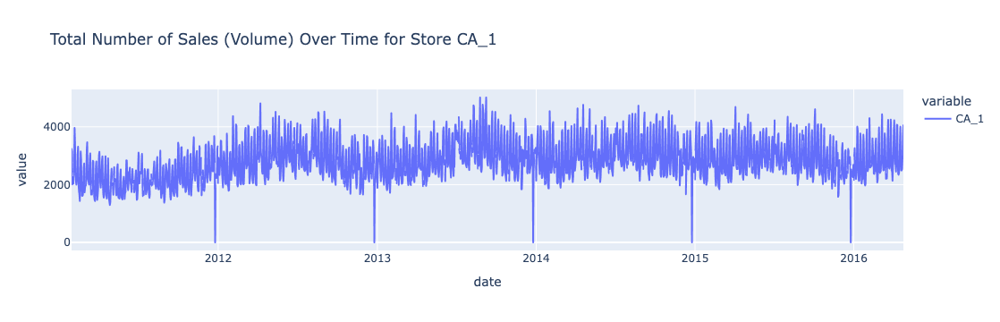

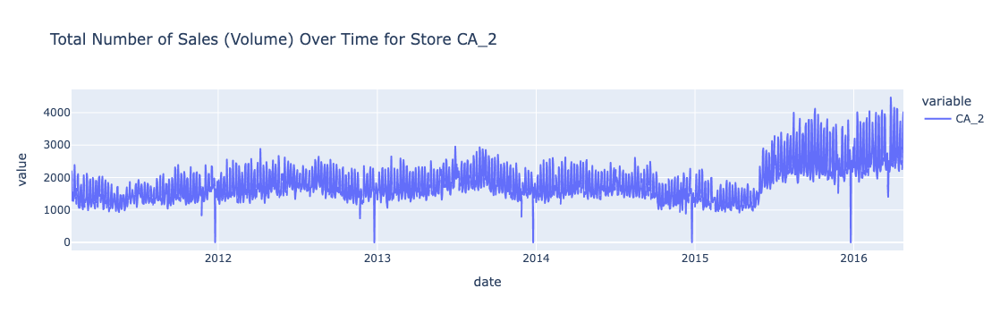

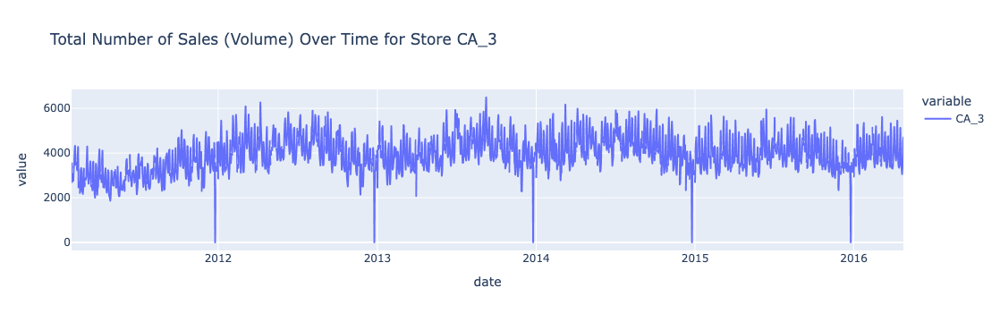

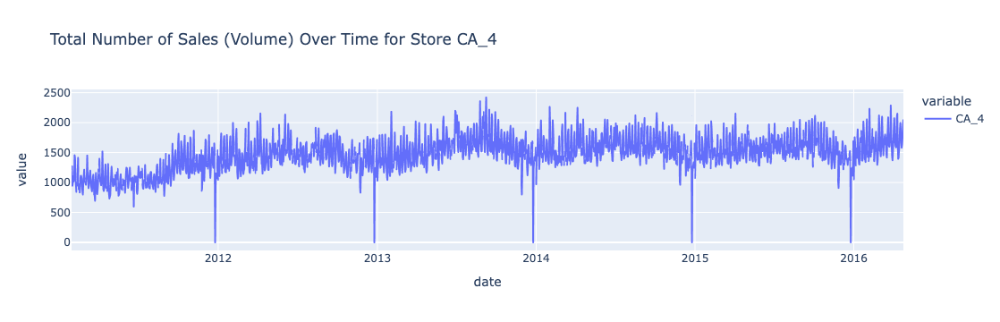

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

In [37]:
for index, row in sales_store.iterrows():
    plt.figure(figsize=(12,5))
    row=row.T
    fig = px.line(row, title=f'Total Number of Sales (Volume) Over Time for Store {index}')
    fig.show()

Looks like there are periods where sales really plummet in December, likely the Christmas holiday.  Good to keep in mind for modeling!

Also, there's a pretty big change in volume between 2015-2016.  What happened there?  New products introduced?

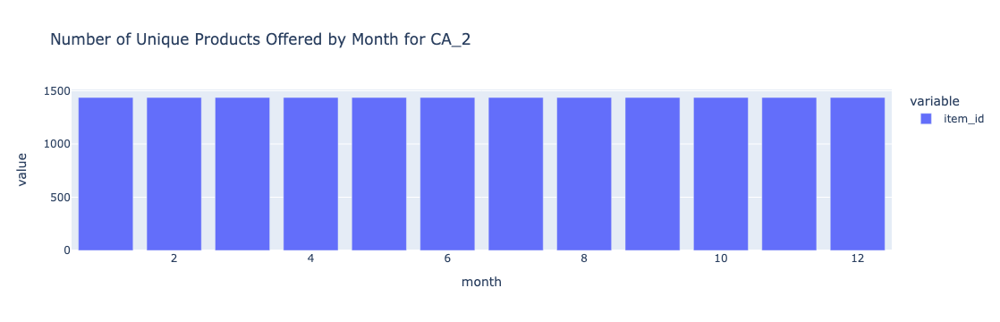

In [38]:
#Check the number of unique product offerings by month between 2015 and 2016 and see if there's any difference

product_offerings = df_sample[(df_sample['store_id']=='CA_2') & (df_sample['year']==2015)].groupby(['month'])['item_id'].nunique()

fig = px.bar(product_offerings, title='Number of Unique Products Offered by Month for CA_2')

fig.show()

So this appears to show that there were no new products offered for that store during that time period.  Something to keep in mind though.

In [39]:
#Plot sales by category (just food here)

/var/folders/tb/tcyvmh0x1457_fgm58t3gh640000gn/T/ipykernel_19176/4007854624.py:1: FutureWarning:

The provided callable <function sum at 0x10f1fd2d0> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.



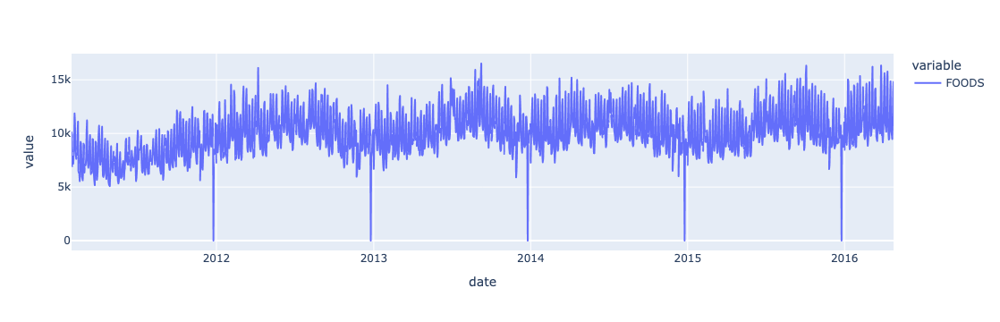

<Figure size 1200x500 with 0 Axes>

In [40]:
sales_category = df_sample.pivot_table(index='cat_id', columns='date', values='sales', aggfunc=np.sum)

for index, row in sales_category.iterrows():
    plt.figure(figsize=(12,5))
    row = row.T
    fig = px.line(row)
    #plt.title(f'Total Number of Sales Over Time for {index}')
    fig.show()
    

There definitely looks like there is some seasonality to food sales where sales peak in April-July and bottom out in December due to the holidays.

/var/folders/tb/tcyvmh0x1457_fgm58t3gh640000gn/T/ipykernel_19176/887854181.py:3: FutureWarning:

The provided callable <function sum at 0x10f1fd2d0> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.



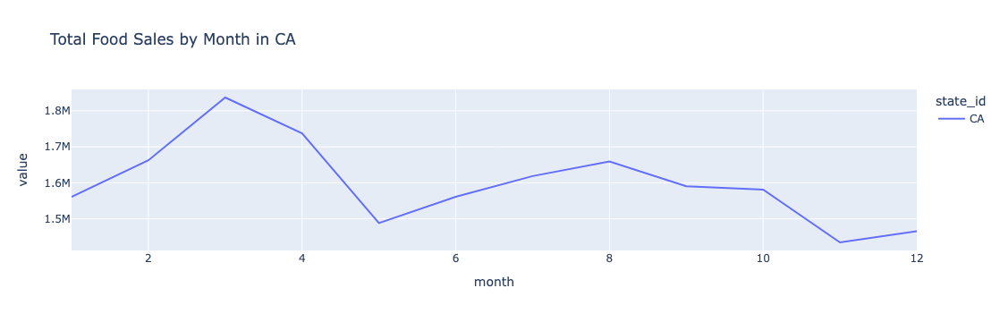

In [41]:
#Plot total sales by month just out of curiosity

sales_month = df_sample.pivot_table(index='state_id', columns='month', values='sales', aggfunc=np.sum)
sales_month = sales_month.T

fig = px.line(sales_month, title='Total Food Sales by Month in CA')

fig.show()

In [42]:
#Plot total food sales by week

/var/folders/tb/tcyvmh0x1457_fgm58t3gh640000gn/T/ipykernel_19176/3374635085.py:1: FutureWarning:

The provided callable <function sum at 0x10f1fd2d0> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.



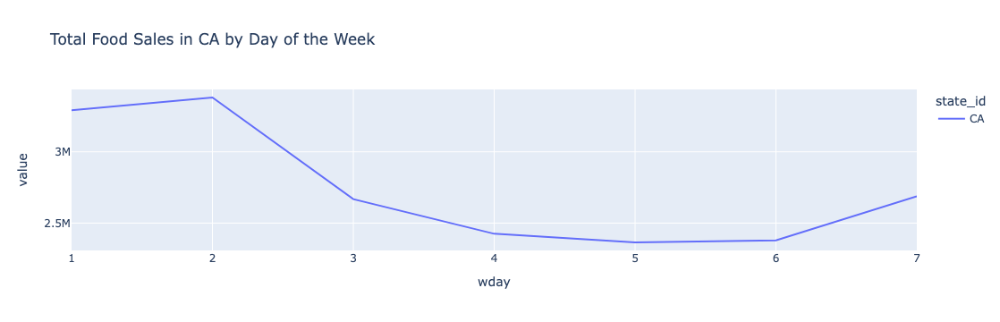

In [43]:
sales_week = df_sample.pivot_table(index='state_id', columns='wday', values='sales', aggfunc=np.sum)

sales_week = sales_week.T

fig = px.line(sales_week, title='Total Food Sales in CA by Day of the Week')
fig.show()

/var/folders/tb/tcyvmh0x1457_fgm58t3gh640000gn/T/ipykernel_19176/2627857226.py:1: FutureWarning:

The provided callable <function mean at 0x10f1fe200> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.



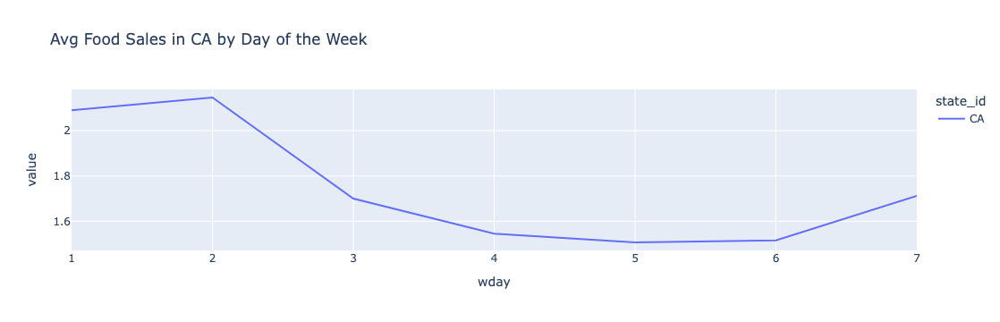

In [44]:
sales_week_avg = df_sample.pivot_table(index='state_id', columns='wday', values='sales', aggfunc=np.mean)

sales_week_avg = sales_week_avg.T

fig = px.line(sales_week_avg, title='Avg Food Sales in CA by Day of the Week')

fig.show()

In [45]:
#At this point, we should also check the correlations in lags, since these should also be useful in a time series model.  

In [46]:
#To make the lags easier to compute, let's have the dates as the index and sales as the column

In [47]:
lag_df = df_sample.copy()


lag_df = df_sample.pivot_table(index=['date', 'store_id'], aggfunc={'sales':np.sum,
                                                                    'sell_price':np.mean}).reset_index()

lag_df.head(15)

/var/folders/tb/tcyvmh0x1457_fgm58t3gh640000gn/T/ipykernel_19176/1591480554.py:4: FutureWarning:

The provided callable <function sum at 0x10f1fd2d0> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.

/var/folders/tb/tcyvmh0x1457_fgm58t3gh640000gn/T/ipykernel_19176/1591480554.py:4: FutureWarning:

The provided callable <function mean at 0x10f1fe200> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.



,date,store_id,sales,sell_price
0,2011-01-29,CA_1,3239,3.149220
1,2011-01-29,CA_2,2193,2.876585
2,2011-01-29,CA_3,3446,3.041969
3,2011-01-29,CA_4,1223,2.953270
4,2011-01-30,CA_1,3137,3.149220
5,2011-01-30,CA_2,1921,2.876585
6,2011-01-30,CA_3,3535,3.041969
7,2011-01-30,CA_4,1269,2.953270
8,2011-01-31,CA_1,2008,3.149220
9,2011-01-31,CA_2,1289,2.876585


In [48]:
#Generate lags up to 30 days prior to the current day  of sales

In [49]:
n = 31

for l in range(1, n+1):
    lag_df[f'lag_{l}'] = lag_df.groupby('store_id')['sales'].shift(l)



lag_df['rolling_28'] =lag_df.groupby('store_id')['sales'].rolling(window=7).mean().shift(28).reset_index(0, drop=True)
lag_df['sell_price_28'] = lag_df.groupby('store_id')['sell_price'].rolling(window=7).mean().shift(28).reset_index(0, drop=True)
#Also add in variation in price
lag_df['std_price_28'] = lag_df.groupby('store_id')['sell_price'].rolling(window=7).std().shift(28).reset_index(0, drop=True)
lag_df['std_sales_28'] = lag_df.groupby('store_id')['sales'].rolling(window=7).std().shift(28).reset_index(0, drop=True)

lag_df.tail(20)

,date,store_id,sales,sell_price,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,lag_13,lag_14,lag_15,lag_16,lag_17,lag_18,lag_19,lag_20,lag_21,lag_22,lag_23,lag_24,lag_25,lag_26,lag_27,lag_28,lag_29,lag_30,lag_31,rolling_28,sell_price_28,std_price_28,std_sales_28
7632,2016-04-20,CA_1,2490,3.346966,2488.0,2886.0,4004.0,3481.0,2706.0,2421.0,2341.0,2372.0,2876.0,4061.0,4073.0,3141.0,2450.0,2698.0,2711.0,3273.0,4226.0,3890.0,3132.0,2651.0,2135.0,2481.0,2480.0,3366.0,4251.0,3421.0,2681.0,2554.0,2598.0,2766.0,4240.0,2977.571429,3.345701,0.000401,725.775644
7633,2016-04-20,CA_2,2506,3.334495,2410.0,2625.0,3729.0,3423.0,2891.0,2200.0,2264.0,2627.0,2621.0,4111.0,4118.0,2896.0,2451.0,2458.0,2293.0,2664.0,4150.0,3799.0,3081.0,2340.0,2360.0,2433.0,2376.0,4101.0,4467.0,3177.0,2261.0,2177.0,2514.0,2245.0,1406.0,2169.714286,3.340787,0.001151,451.401416
7634,2016-04-20,CA_3,3286,3.334238,3468.0,3827.0,5127.0,4307.0,3471.0,3344.0,3403.0,3692.0,4202.0,5453.0,4910.0,3937.0,3667.0,3829.0,4132.0,4195.0,5171.0,4466.0,3977.0,3432.0,3299.0,3493.0,3335.0,4906.0,5333.0,4204.0,3380.0,3666.0,3761.0,4003.0,4755.0,3954.285714,3.326545,0.001277,577.506050
7635,2016-04-20,CA_4,1581,3.346841,1722.0,1879.0,1995.0,1883.0,1664.0,1541.0,1415.0,1395.0,1694.0,2150.0,2091.0,1597.0,1586.0,1607.0,1665.0,1840.0,2074.0,1920.0,1701.0,1518.0,1371.0,1438.0,1630.0,1823.0,2287.0,1817.0,1704.0,1598.0,1602.0,1700.0,2088.0,1717.714286,3.345338,0.000095,216.412195
7636,2016-04-21,CA_1,2533,3.346966,2490.0,2488.0,2886.0,4004.0,3481.0,2706.0,2421.0,2341.0,2372.0,2876.0,4061.0,4073.0,3141.0,2450.0,2698.0,2711.0,3273.0,4226.0,3890.0,3132.0,2651.0,2135.0,2481.0,2480.0,3366.0,4251.0,3421.0,2681.0,2554.0,2598.0,2766.0,3044.714286,3.345819,0.000310,661.975255
7637,2016-04-21,CA_2,2261,3.334495,2506.0,2410.0,2625.0,3729.0,3423.0,2891.0,2200.0,2264.0,2627.0,2621.0,4111.0,4118.0,2896.0,2451.0,2458.0,2293.0,2664.0,4150.0,3799.0,3081.0,2340.0,2360.0,2433.0,2376.0,4101.0,4467.0,3177.0,2261.0,2177.0,2514.0,2245.0,2160.428571,3.341124,0.000892,448.308620
7638,2016-04-21,CA_3,3056,3.334238,3286.0,3468.0,3827.0,5127.0,4307.0,3471.0,3344.0,3403.0,3692.0,4202.0,5453.0,4910.0,3937.0,3667.0,3829.0,4132.0,4195.0,5171.0,4466.0,3977.0,3432.0,3299.0,3493.0,3335.0,4906.0,5333.0,4204.0,3380.0,3666.0,3761.0,4003.0,3960.857143,3.326919,0.000989,569.477371
7639,2016-04-21,CA_4,1629,3.346841,1581.0,1722.0,1879.0,1995.0,1883.0,1664.0,1541.0,1415.0,1395.0,1694.0,2150.0,2091.0,1597.0,1586.0,1607.0,1665.0,1840.0,2074.0,1920.0,1701.0,1518.0,1371.0,1438.0,1630.0,1823.0,2287.0,1817.0,1704.0,1598.0,1602.0,1700.0,1758.714286,3.345365,0.000074,172.722045
7640,2016-04-22,CA_1,2960,3.346966,2533.0,2490.0,2488.0,2886.0,4004.0,3481.0,2706.0,2421.0,2341.0,2372.0,2876.0,4061.0,4073.0,3141.0,2450.0,2698.0,2711.0,3273.0,4226.0,3890.0,3132.0,2651.0,2135.0,2481.0,2480.0,3366.0,4251.0,3421.0,2681.0,2554.0,2598.0,3140.714286,3.345936,0.000000,660.668781
7641,2016-04-22,CA_2,2871,3.334495,2261.0,2506.0,2410.0,2625.0,3729.0,3423.0,2891.0,2200.0,2264.0,2627.0,2621.0,4111.0,4118.0,2896.0,2451.0,2458.0,2293.0,2664.0,4150.0,3799.0,3081.0,2340.0,2360.0,2433.0,2376.0,4101.0,4467.0,3177.0,2261.0,2177.0,2514.0,2221.857143,3.341461,0.000000,558.095102


In [50]:
lag_df.head(1)

,date,store_id,sales,sell_price,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,lag_13,lag_14,lag_15,lag_16,lag_17,lag_18,lag_19,lag_20,lag_21,lag_22,lag_23,lag_24,lag_25,lag_26,lag_27,lag_28,lag_29,lag_30,lag_31,rolling_28,sell_price_28,std_price_28,std_sales_28
0,2011-01-29,CA_1,3239,3.14922,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [52]:
lag_df[lag_df['store_id']=='CA_1'].head(100)

,date,store_id,sales,sell_price,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,lag_13,lag_14,lag_15,lag_16,lag_17,lag_18,lag_19,lag_20,lag_21,lag_22,lag_23,lag_24,lag_25,lag_26,lag_27,lag_28,lag_29,lag_30,lag_31,rolling_28,sell_price_28,std_price_28,std_sales_28
0,2011-01-29,CA_1,3239,3.149220,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2011-01-30,CA_1,3137,3.149220,3239.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2011-01-31,CA_1,2008,3.149220,3137.0,3239.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12,2011-02-01,CA_1,2258,3.149220,2008.0,3137.0,3239.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16,2011-02-02,CA_1,2032,3.149220,2258.0,2008.0,3137.0,3239.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20,2011-02-03,CA_1,2407,3.149220,2032.0,2258.0,2008.0,3137.0,3239.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24,2011-02-04,CA_1,2693,3.149220,2407.0,2032.0,2258.0,2008.0,3137.0,3239.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28,2011-02-05,CA_1,3962,3.153394,2693.0,2407.0,2032.0,2258.0,2008.0,3137.0,3239.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32,2011-02-06,CA_1,3418,3.153394,3962.0,2693.0,2407.0,2032.0,2258.0,2008.0,3137.0,3239.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36,2011-02-07,CA_1,2446,3.153394,3418.0,3962.0,2693.0,2407.0,2032.0,2258.0,2008.0,3137.0,3239.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [53]:
#Check the correlation of the lags to sales

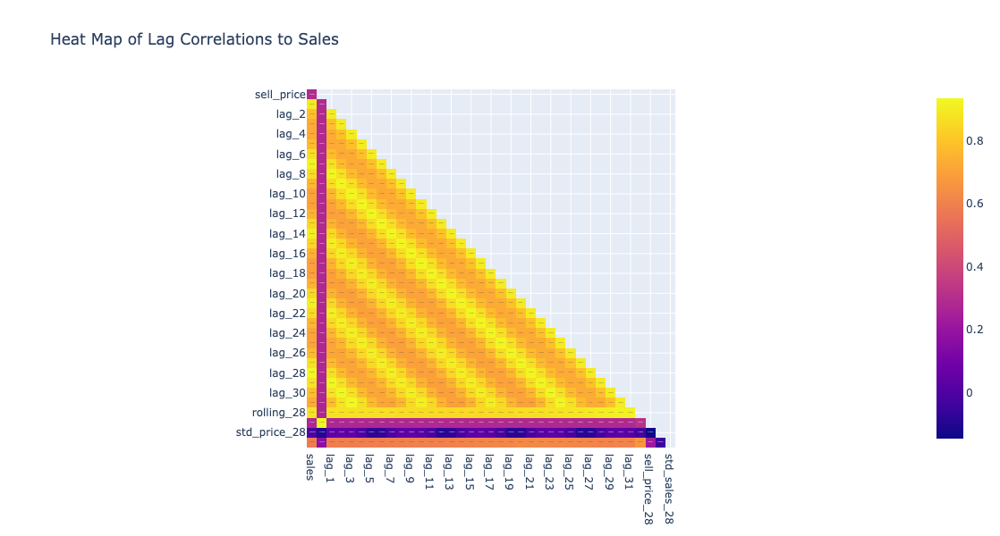

In [54]:
corrs = lag_df.set_index(['date', 'store_id']).corr()

#Make heatmap of corrs
mask = np.zeros_like(corrs, dtype='bool')
mask[np.triu_indices_from(mask)]= True
viz = corrs.mask(mask).dropna(how='all')
fig = px.imshow(viz, text_auto=True, title='Heat Map of Lag Correlations to Sales')
#fig.show()
fig.update_layout(
    width=900,
    height=600
)
fig.show()

The interesthing thing about this plot is that it shows the 28 day lag having a higher positive correlation with our outcome (sales) than any other lag variable, even the 1 day lag.  That is interesting!  The next closest is the 7 day lag.  

### Some Modeling Prep/Feature Engineering

In [55]:
#Join the lag_df dataframe back to the calendar data to get some other date indicators like SNAP and holidays

In [56]:
df_calendar.head()

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1


Seems like the event types don't agree so let's just combine these into a single 'holiday' indicator for a given date. 
There are a few categories and I think just coding the new 'holiday' field to be 1 if it is a national holiday is probably okay.
It might end up obscuring some info about whether some holidays have more impact than others but let's see how it goes.

In [57]:
#Create dummies for the different types of holidays and maybe pre-holiday indicators too

df_calendar['holiday'] = np.where(df_calendar['event_type_1']=='National', 1, 
                                 np.where(df_calendar['event_type_2']=='National', 1,
                                         0))

df_calendar['holiday'].value_counts()

holiday
0    1917
1      52
Name: count, dtype: int64

Double check the coding looks as expected

In [58]:
df_calendar[df_calendar['holiday']==1]

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,holiday
23,2011-02-21,11104,Monday,3,2,2011,d_24,PresidentsDay,National,NaN,NaN,0,0,0,1
121,2011-05-30,11118,Monday,3,5,2011,d_122,MemorialDay,National,NaN,NaN,0,0,0,1
156,2011-07-04,11123,Monday,3,7,2011,d_157,IndependenceDay,National,NaN,NaN,1,0,0,1
219,2011-09-05,11132,Monday,3,9,2011,d_220,LaborDay,National,NaN,NaN,1,1,1,1
254,2011-10-10,11137,Monday,3,10,2011,d_255,ColumbusDay,National,NaN,NaN,1,0,0,1
286,2011-11-11,11141,Friday,7,11,2011,d_287,VeteransDay,National,NaN,NaN,0,1,1,1
299,2011-11-24,11143,Thursday,6,11,2011,d_300,Thanksgiving,National,NaN,NaN,0,0,0,1
330,2011-12-25,11148,Sunday,2,12,2011,d_331,Christmas,National,NaN,NaN,0,0,0,1
337,2012-01-01,11149,Sunday,2,1,2012,d_338,NewYear,National,NaN,NaN,1,1,0,1
352,2012-01-16,11151,Monday,3,1,2012,d_353,MartinLutherKingDay,National,NaN,NaN,0,0,0,1


In [59]:
#Also make a 1/0 indicator for the day prior to a national holiday as well as well as post holiday

condition = df_calendar['holiday']==1

In [60]:
df_calendar['pre_nat_holiday'] = np.where(condition.shift(-1, fill_value=False), 1, 0)
df_calendar['post_nat_holiday'] = np.where(condition.shift(1, fill_value=False), 1, 0)
#Confirm it worked
df_calendar.head(100)

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,holiday,pre_nat_holiday,post_nat_holiday
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0,0,0,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1,0,0,0
5,2011-02-03,11101,Thursday,6,2,2011,d_6,NaN,NaN,NaN,NaN,1,1,1,0,0,0
6,2011-02-04,11101,Friday,7,2,2011,d_7,NaN,NaN,NaN,NaN,1,0,0,0,0,0
7,2011-02-05,11102,Saturday,1,2,2011,d_8,NaN,NaN,NaN,NaN,1,1,1,0,0,0
8,2011-02-06,11102,Sunday,2,2,2011,d_9,SuperBowl,Sporting,NaN,NaN,1,1,1,0,0,0
9,2011-02-07,11102,Monday,3,2,2011,d_10,NaN,NaN,NaN,NaN,1,1,0,0,0,0


Looks good!

Now, just keep a few of these fields to join to our lag dataframe

In [61]:
df_calendar_dos = df_calendar[['date', 'wday', 'month', 'year', 'snap_CA', 'holiday', 'pre_nat_holiday', 'post_nat_holiday']]


#Also make dummies for the day of the month as well
df_calendar_dos['week_of_year'] = pd.to_datetime(df_calendar_dos['date']).dt.isocalendar().week

df_calendar_dos

/var/folders/tb/tcyvmh0x1457_fgm58t3gh640000gn/T/ipykernel_19176/2218774802.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,wday,month,year,snap_CA,holiday,pre_nat_holiday,post_nat_holiday,week_of_year
0,2011-01-29,1,1,2011,0,0,0,0,4
1,2011-01-30,2,1,2011,0,0,0,0,4
2,2011-01-31,3,1,2011,0,0,0,0,5
3,2011-02-01,4,2,2011,1,0,0,0,5
4,2011-02-02,5,2,2011,1,0,0,0,5
...,...,...,...,...,...,...,...,...,...
1964,2016-06-15,5,6,2016,0,0,0,0,24
1965,2016-06-16,6,6,2016,0,0,0,0,24
1966,2016-06-17,7,6,2016,0,0,0,0,24
1967,2016-06-18,1,6,2016,0,0,0,0,24


In [62]:
dummies = pd.get_dummies(df_calendar_dos, columns=['wday', 'month', 'year', 'week_of_year'], dtype='int')

dummies.head()

,date,snap_CA,holiday,pre_nat_holiday,post_nat_holiday,wday_1,wday_2,wday_3,wday_4,wday_5,wday_6,wday_7,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,year_2011,year_2012,year_2013,year_2014,year_2015,year_2016,week_of_year_1,week_of_year_2,week_of_year_3,week_of_year_4,week_of_year_5,week_of_year_6,week_of_year_7,week_of_year_8,week_of_year_9,week_of_year_10,week_of_year_11,week_of_year_12,week_of_year_13,week_of_year_14,week_of_year_15,week_of_year_16,week_of_year_17,week_of_year_18,week_of_year_19,week_of_year_20,week_of_year_21,week_of_year_22,week_of_year_23,week_of_year_24,week_of_year_25,week_of_year_26,week_of_year_27,week_of_year_28,week_of_year_29,week_of_year_30,week_of_year_31,week_of_year_32,week_of_year_33,week_of_year_34,week_of_year_35,week_of_year_36,week_of_year_37,week_of_year_38,week_of_year_39,week_of_year_40,week_of_year_41,week_of_year_42,week_of_year_43,week_of_year_44,week_of_year_45,week_of_year_46,week_of_year_47,week_of_year_48,week_of_year_49,week_of_year_50,week_of_year_51,week_of_year_52,week_of_year_53
0,2011-01-29,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2011-01-30,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2011-01-31,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,2011-02-01,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,2011-02-02,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [63]:
#Join this back to the lag dataframe now via the date field

In [64]:
lag_df = lag_df.loc[:, lag_df.columns.isin(['date', 'store_id', 'sales', 'lag_28', 'lag_29', 'lag_30', 'sell_price_28', 'std_sales_28'])]

lag_df.head()

,date,store_id,sales,lag_28,lag_29,lag_30,sell_price_28,std_sales_28
0,2011-01-29,CA_1,3239,NaN,NaN,NaN,NaN,NaN
1,2011-01-29,CA_2,2193,NaN,NaN,NaN,3.345459,657.175631
2,2011-01-29,CA_3,3446,NaN,NaN,NaN,3.339547,934.868949
3,2011-01-29,CA_4,1223,NaN,NaN,NaN,3.327651,773.062494
4,2011-01-30,CA_1,3137,NaN,NaN,NaN,NaN,NaN


In [65]:
sales_final = pd.merge(lag_df, dummies, on='date', how='left')

#Drop the first n rows where the lags are NULL/NAN. Want full data

#Because we want to predict as far as 28 days out, we should really only keep the 28 day lag.
lag_cols = ['lag_28', 'sell_price_28', 'std_sales_28', 'lag_29', 'lag_30']

sales_final.dropna(subset=lag_cols, inplace=True)

sales_final.head()

,date,store_id,sales,lag_28,lag_29,lag_30,sell_price_28,std_sales_28,snap_CA,holiday,pre_nat_holiday,post_nat_holiday,wday_1,wday_2,wday_3,wday_4,wday_5,wday_6,wday_7,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,year_2011,year_2012,year_2013,year_2014,year_2015,year_2016,week_of_year_1,week_of_year_2,week_of_year_3,week_of_year_4,week_of_year_5,week_of_year_6,week_of_year_7,week_of_year_8,week_of_year_9,week_of_year_10,week_of_year_11,week_of_year_12,week_of_year_13,week_of_year_14,week_of_year_15,week_of_year_16,week_of_year_17,week_of_year_18,week_of_year_19,week_of_year_20,week_of_year_21,week_of_year_22,week_of_year_23,week_of_year_24,week_of_year_25,week_of_year_26,week_of_year_27,week_of_year_28,week_of_year_29,week_of_year_30,week_of_year_31,week_of_year_32,week_of_year_33,week_of_year_34,week_of_year_35,week_of_year_36,week_of_year_37,week_of_year_38,week_of_year_39,week_of_year_40,week_of_year_41,week_of_year_42,week_of_year_43,week_of_year_44,week_of_year_45,week_of_year_46,week_of_year_47,week_of_year_48,week_of_year_49,week_of_year_50,week_of_year_51,week_of_year_52,week_of_year_53
136,2011-03-04,CA_1,2369,2693.0,2407.0,2032.0,3.149220,501.117893,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
137,2011-03-04,CA_2,1387,1785.0,1494.0,1278.0,2.876585,339.435526,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
138,2011-03-04,CA_3,2939,3455.0,3340.0,2761.0,3.041969,345.497709,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
139,2011-03-04,CA_4,1069,1072.0,1015.0,1107.0,2.953270,118.635095,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
140,2011-03-05,CA_1,3223,3962.0,2693.0,2407.0,3.149816,703.178701,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [66]:
#One thing I noticed from above was that the Christmas holiday caused sales to drop to zero, so I'm going to add an additional indicator 
#for Christmas so the model knows when this is happening and can learn that sales are non-existent (due to store closure I assume).

sales_final['xmas'] = np.where((pd.to_datetime(sales_final['date']).dt.month==12) & (pd.to_datetime(sales_final['date']).dt.day==25), 1, 0)

sales_final['xmas'].value_counts()

xmas
0    7496
1      20
Name: count, dtype: int64

In [67]:
sales_final.shape

(7516, 91)

Now let's start doing some modeling!  I'm going to just leave these features in and see how the model does.  There's def room to create more features though like moving averages and such.

In [68]:
#Define our features
weekday_cols = [i for i in sales_final.columns if 'wday' in i]
month_cols = [i for i in sales_final.columns if 'month' in i]
year_cols = [i for i in sales_final.columns if 'year' in i]
day_cols = [i for i in sales_final.columns if 'day_of_month' in i]
#Keep store id for now.  Will drop later
other_features = ['post_nat_holiday', 'pre_nat_holiday', 'holiday', 'store_id', 'snap_CA', 'xmas']

feature_cols = [lag_cols + weekday_cols + month_cols + year_cols + other_features][0]

sales_final[feature_cols]

,lag_28,sell_price_28,std_sales_28,lag_29,lag_30,wday_1,wday_2,wday_3,wday_4,wday_5,wday_6,wday_7,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,year_2011,year_2012,year_2013,year_2014,year_2015,year_2016,week_of_year_1,week_of_year_2,week_of_year_3,week_of_year_4,week_of_year_5,week_of_year_6,week_of_year_7,week_of_year_8,week_of_year_9,week_of_year_10,week_of_year_11,week_of_year_12,week_of_year_13,week_of_year_14,week_of_year_15,week_of_year_16,week_of_year_17,week_of_year_18,week_of_year_19,week_of_year_20,week_of_year_21,week_of_year_22,week_of_year_23,week_of_year_24,week_of_year_25,week_of_year_26,week_of_year_27,week_of_year_28,week_of_year_29,week_of_year_30,week_of_year_31,week_of_year_32,week_of_year_33,week_of_year_34,week_of_year_35,week_of_year_36,week_of_year_37,week_of_year_38,week_of_year_39,week_of_year_40,week_of_year_41,week_of_year_42,week_of_year_43,week_of_year_44,week_of_year_45,week_of_year_46,week_of_year_47,week_of_year_48,week_of_year_49,week_of_year_50,week_of_year_51,week_of_year_52,week_of_year_53,post_nat_holiday,pre_nat_holiday,holiday,store_id,snap_CA,xmas
136,2693.0,3.149220,501.117893,2407.0,2032.0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CA_1,1,0
137,1785.0,2.876585,339.435526,1494.0,1278.0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CA_2,1,0
138,3455.0,3.041969,345.497709,3340.0,2761.0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CA_3,1,0
139,1072.0,2.953270,118.635095,1015.0,1107.0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CA_4,1,0
140,3962.0,3.149816,703.178701,2693.0,2407.0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CA_1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7647,2287.0,3.345399,262.722287,1817.0,1704.0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CA_4,0,0
7648,3366.0,3.345618,623.868042,4251.0,3421.0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CA_1,0,0
7649,4101.0,3.340185,950.860087,4467.0,3177.0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CA_2,0,0
7650,4906.0,3.327532,703.342022,5333.0,4204.0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CA_3,0,0


In [69]:
sales_final = sales_final[sales_final['store_id']=='CA_1']

#Reset the index on sales_final
sales_final = sales_final.reset_index(drop=True)

train_window_size=70 #in days
predict_window_size = 28


#Filter to just one store id for now
X = sales_final[feature_cols]

y = sales_final['sales']

#Just use a fixed window for training of the prior 28 days
def rolling_window_cv(data, train_window_size, predict_window_size):
    folds = []
    n_splits = (len(data) - train_window_size) // predict_window_size
    for i in range(n_splits):
        #Get the indices of where to start train data. E.g. The first iteration would be 0*28 so first 28 indices will be used as train data as we end up with 0:28
        train_start = i * train_window_size
        #Get ending index of train end data.  Just taking the first value and adding the window size.
        train_end = train_start + train_window_size 
        #Test start is just the index after the last training index
        test_start = train_end 
        #Test end is just the first test index + the window size we're predicting
        test_end = test_start + predict_window_size
        train_data = data[train_start:train_end]
        test_data = data[test_start:test_end]
        if len(train_data)>0 and len(test_data)>0:
            folds.append((train_data.index.values, test_data.index.values))
        
    return folds

## Note

I wanted some additional practice creating a different cross-validation strategy as well.  Here, instead of the rolling window, I'm using
an expanding window.  The logic is somewhat similar as the above rolling window but there were a few changes needed.  Both of these functions could be pretty useful whenever doing cross validation on time series models, particularly with machine learning models.

In [70]:
def expanding_window_cv(data, initial_train_window_size, predict_window_size, increment_size):
    folds = []
    # To get the right number of splits. 
    n_splits = (len(data) - initial_train_window_size - predict_window_size) // increment_size + 1
    counter = 0
    for i in range(n_splits):
        train_start = 0
        train_end = initial_train_window_size + counter
        test_start = train_end
        test_end = test_start + predict_window_size
        counter += increment_size
        train_data = data[train_start:train_end]
        test_data = data[test_start:test_end]
        folds.append((train_data.index.values, test_data.index.values))
    return folds

folds_expanding_window = expanding_window_cv(X, 30, 28, 10)
fold_rolling_window = rolling_window_cv(X, train_window_size=train_window_size, predict_window_size=28)


In [71]:
# Check that the folds look right

In [72]:
#folds = fold_rolling_window
folds = folds_expanding_window
folds

[(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
         17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
  array([30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46,
         47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57])),
 (array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
         17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
         34, 35, 36, 37, 38, 39]),
  array([40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56,
         57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67])),
 (array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
         17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
         34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]),
  array([50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66,
         67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77])),
 (array([ 0,  1,  2,  3,  4,  5,  6,  7,  8

In [321]:
#Store folds
#folds = rolling_window_cv(X, train_window_size=train_window_size, predict_window_size=28)
#folds = expanding_window_cv(X, 

In [73]:
len(folds)

183

In [77]:
#Define model.  Here, I'm going to use a LightGBM regressor
from sklearn.metrics import mean_squared_error
import lightgbm as lgb
from lightgbm import LGBMRegressor

clf = lgb.LGBMRegressor(learning_rate=.01,
                       n_estimators=1000,
                       metric='rmse',
                        min_child_samples = 10,
                        feature_fraction=.2,
                        verbose=-2 #Only show warning messages as we don't really need all the additional messages that get printed
                        
                       )

feature_cols = [i for i in feature_cols if 'store_id' not in i]

results_df = pd.DataFrame(columns=['rmse', 'rmse_baseline', 'fold'])

df_list = []

for idx, (train, test) in enumerate(folds):
    X_train = X.loc[train][feature_cols]
    y_train = y.loc[train]
    X_test = X.loc[test][feature_cols]
    y_test = y.loc[test]
    model = clf.fit(X_train, y_train)
    preds = model.predict(X_test)
    actuals = y_test.values
    baseline_vals = y_train[-28:].values #What if we just used the last 28 values prior to prediction window
    X_test['preds'] = preds
    X_test['actuals'] = actuals
    mean_sales = X_test['actuals'].mean()
    #Show a plot of the actuals vs predicted for each fold
    actuals_predicted = pd.DataFrame(columns=['date', 'actual', 'predicted'])
    df = sales_final.loc[test]
    df['preds'] = preds
    df['fold'] = idx
    df = df[['date', 'sales', 'preds', 'fold']]
    df_list.append(df)
    #Compute RMSE 
    rmse = np.sqrt(mean_squared_error(actuals, preds))
    rmse_baseline = np.sqrt(mean_squared_error(actuals, baseline_vals))
    result_set_row = pd.DataFrame({'rmse':[rmse], 'rmse_baseline':[rmse_baseline], 'fold':[idx], 'mean_sales':mean_sales})
    results_df = pd.concat([results_df, result_set_row], ignore_index=True)
    

/var/folders/tb/tcyvmh0x1457_fgm58t3gh640000gn/T/ipykernel_19176/3473089276.py:44: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



In [78]:
results_df

,rmse,rmse_baseline,fold,mean_sales
0,347.728853,330.073314,0,2074.071429
1,435.890302,411.482077,1,1993.500000
2,387.510234,407.485802,2,1962.607143
3,254.665368,296.887304,3,1966.678571
4,196.320693,284.306864,4,1987.464286
5,200.008778,297.106523,5,2052.571429
6,227.667008,317.301738,6,2120.714286
7,260.710898,323.744167,7,2202.535714
8,272.143894,282.521428,8,2175.642857
9,241.657264,271.909846,9,2173.250000


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


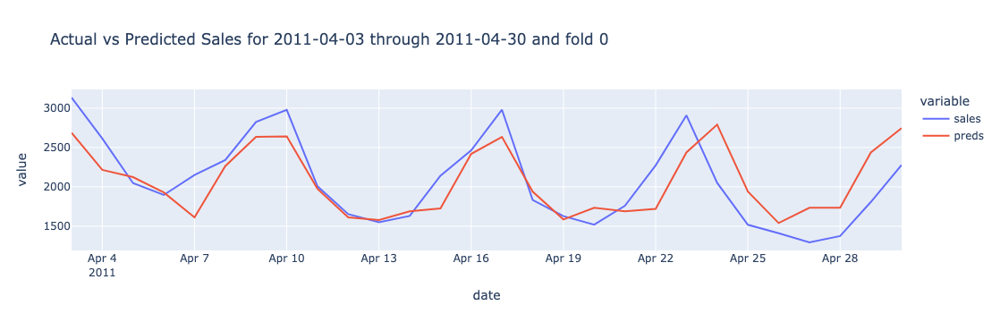

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


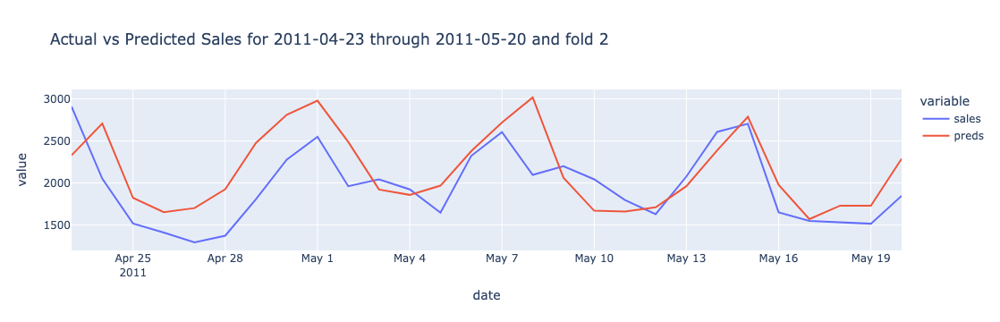

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


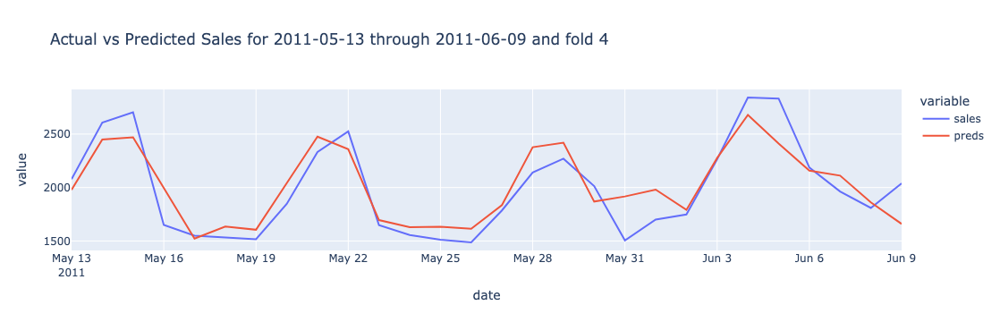

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


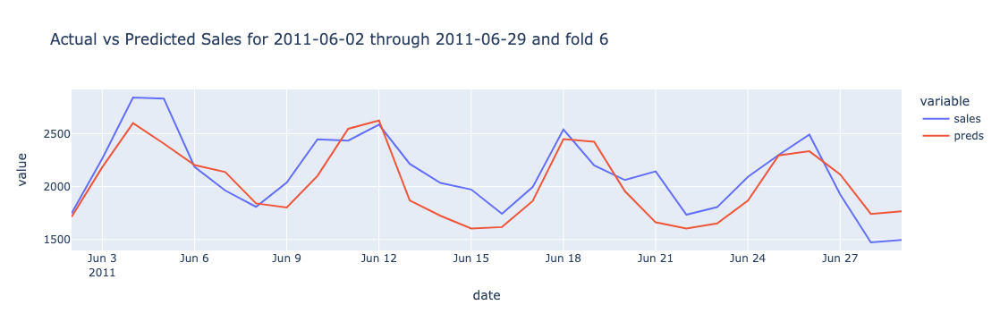

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


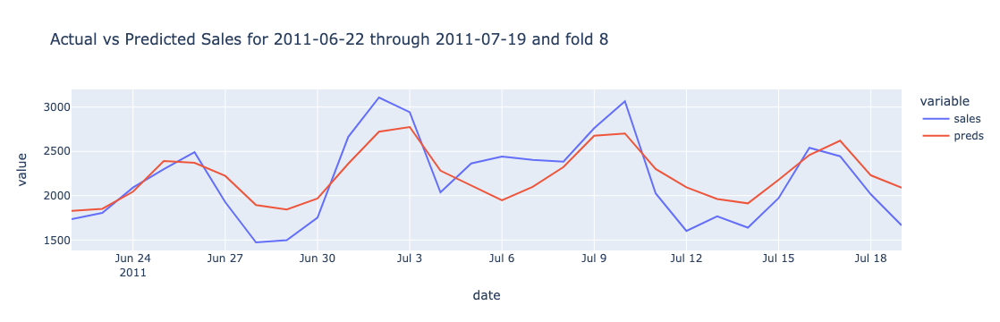

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


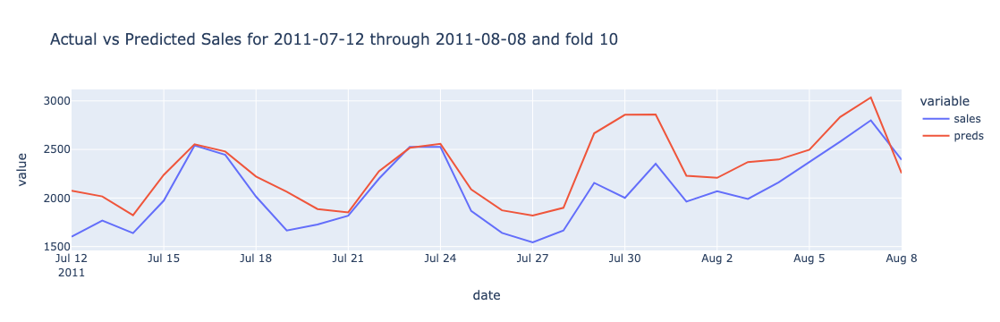

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


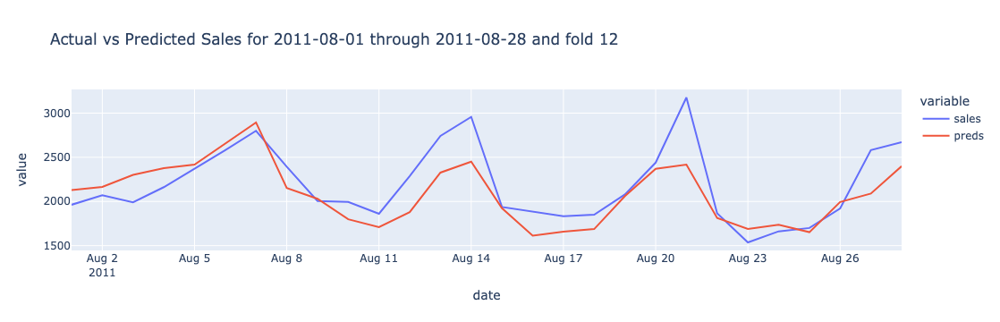

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


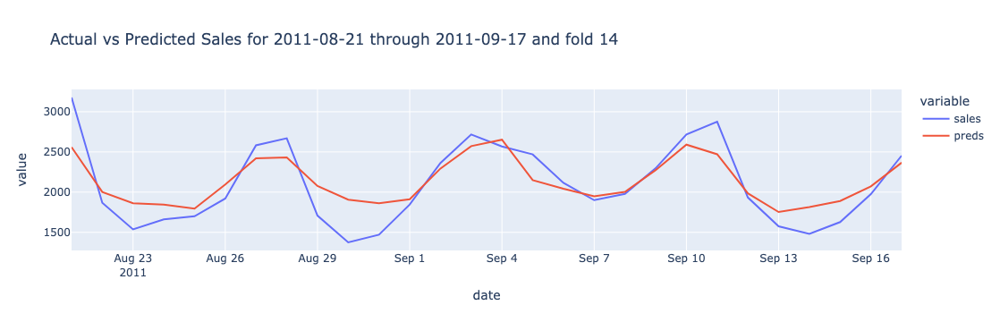

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


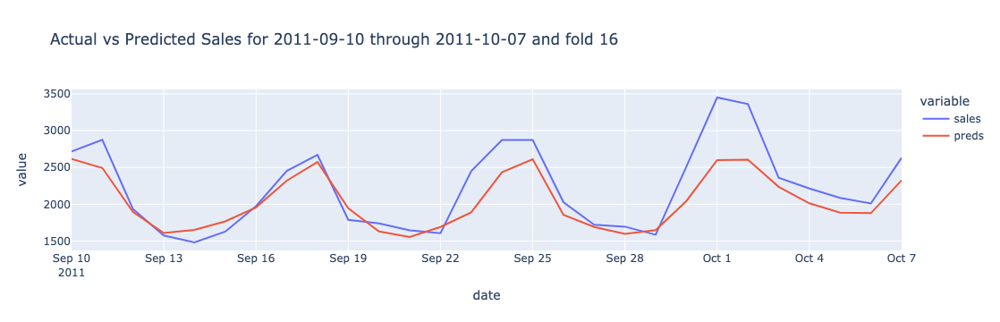

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


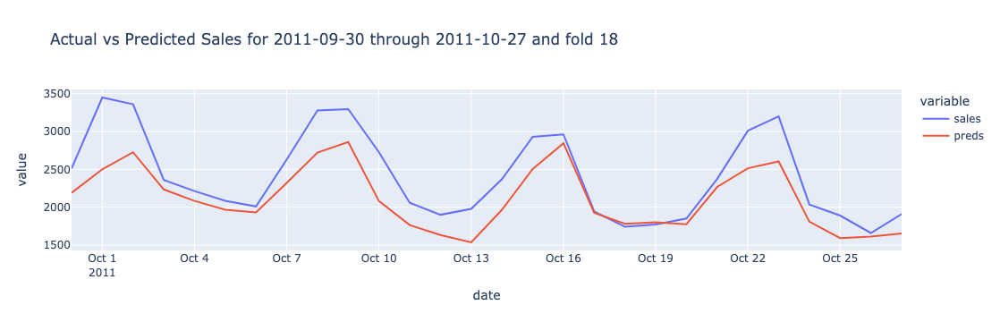

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


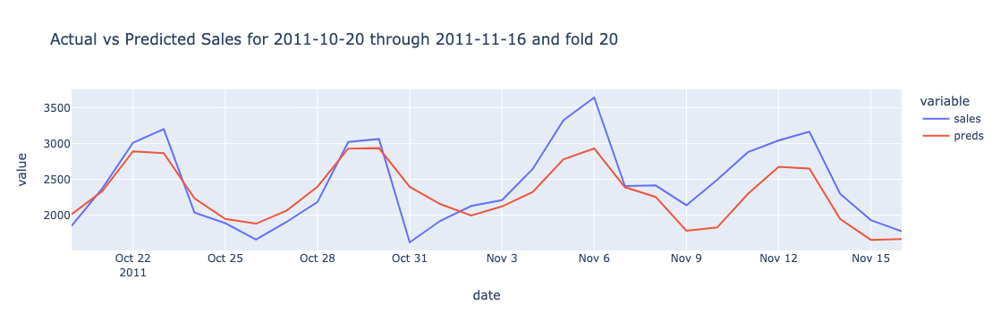

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


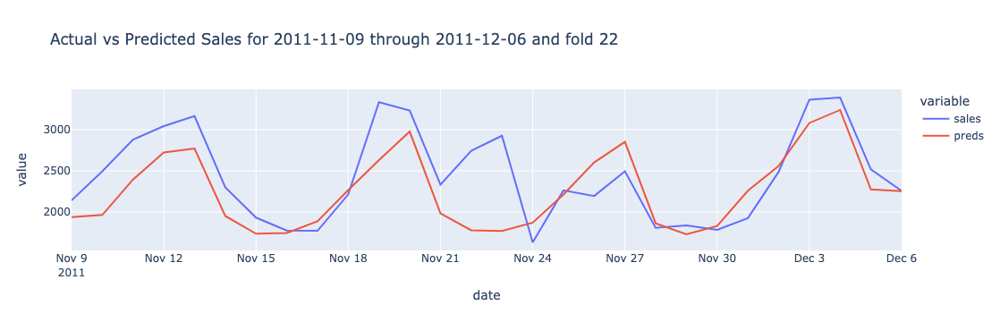

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


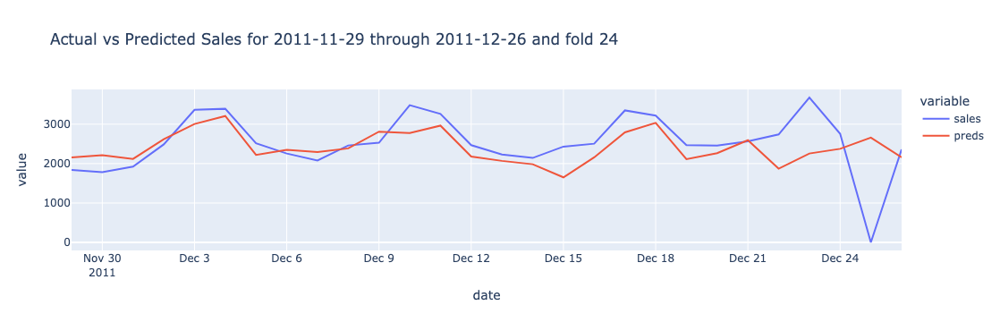

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


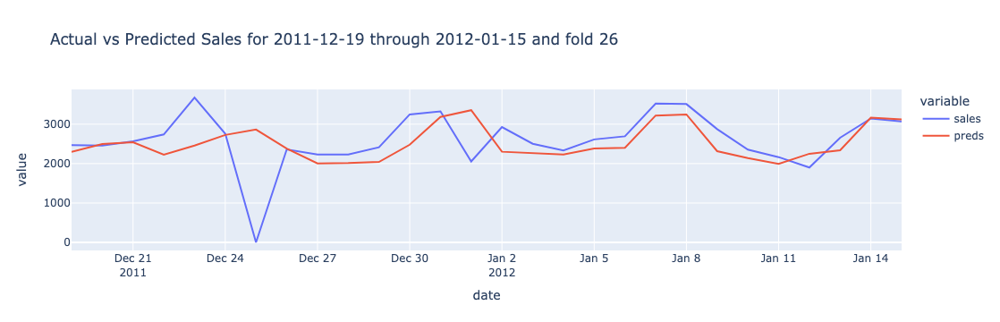

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


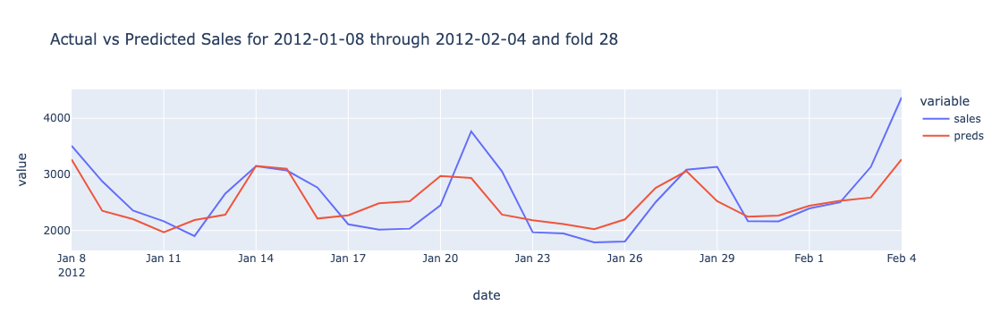

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


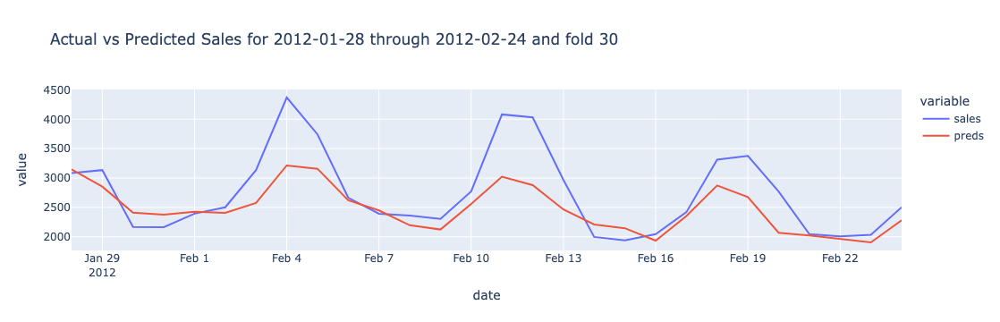

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


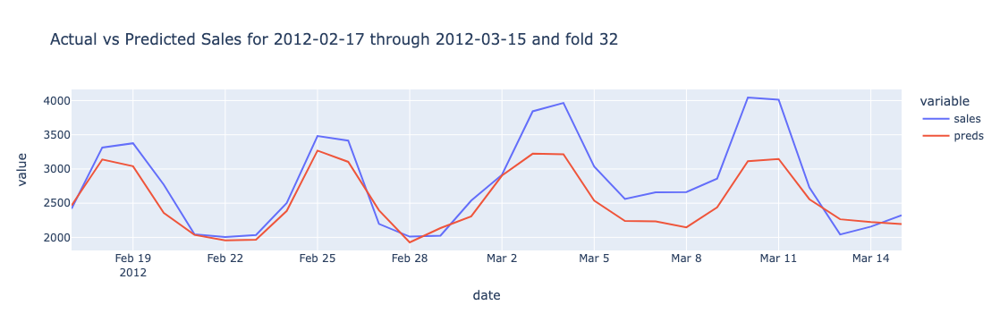

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


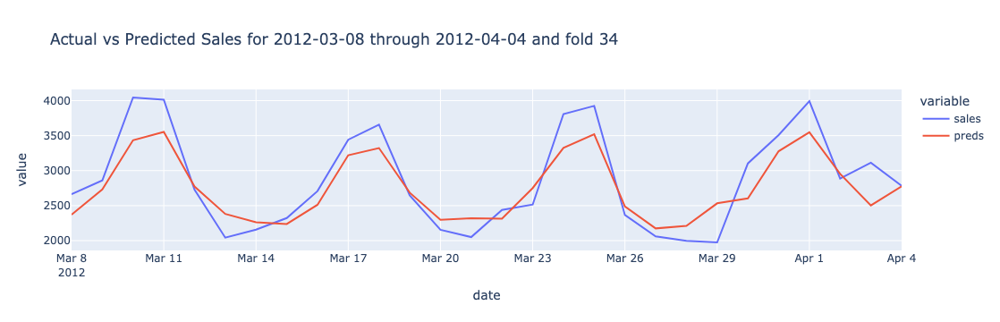

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


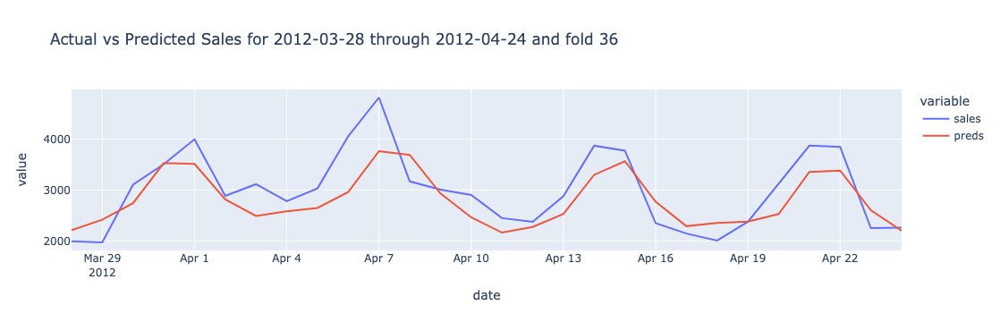

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


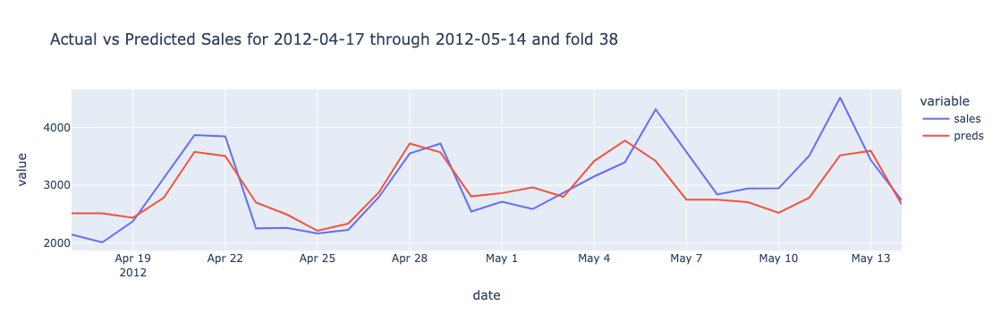

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


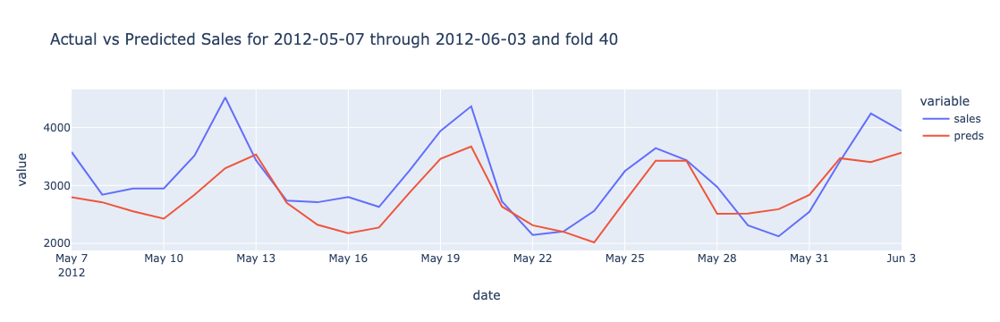

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


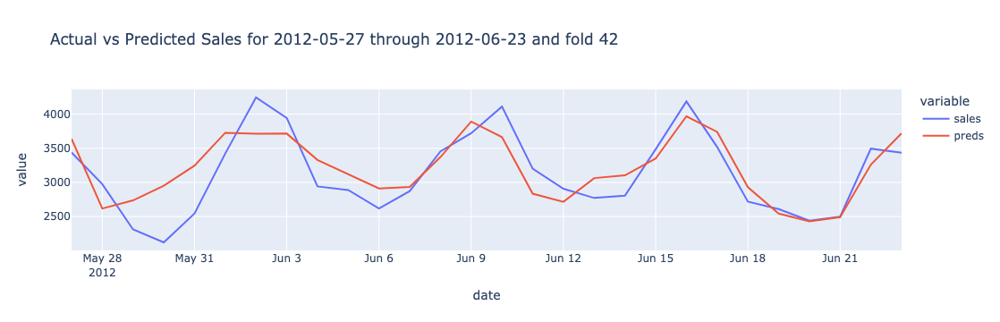

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


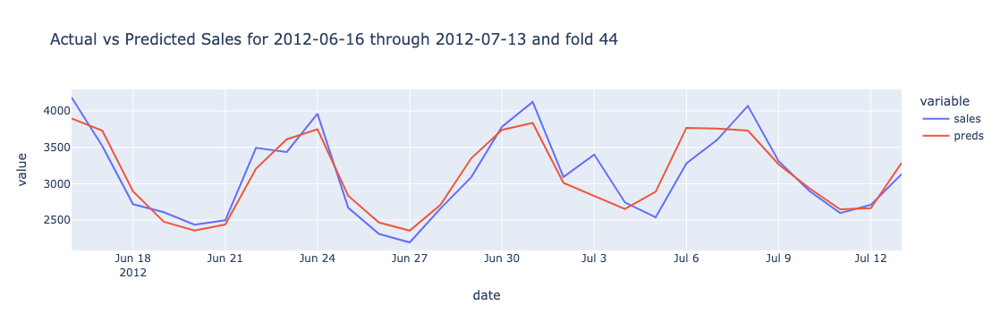

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


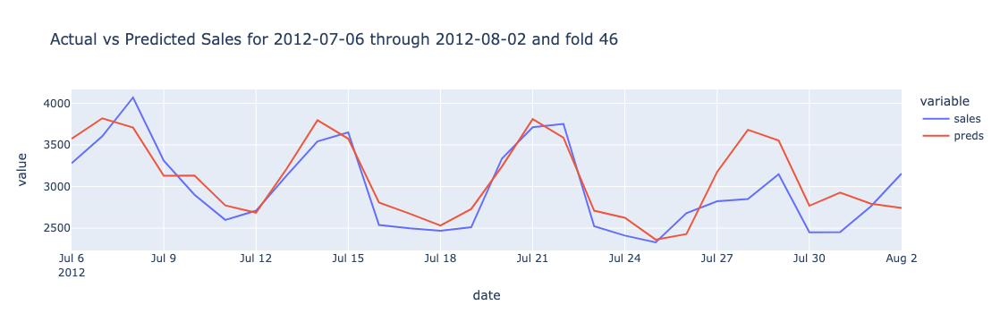

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


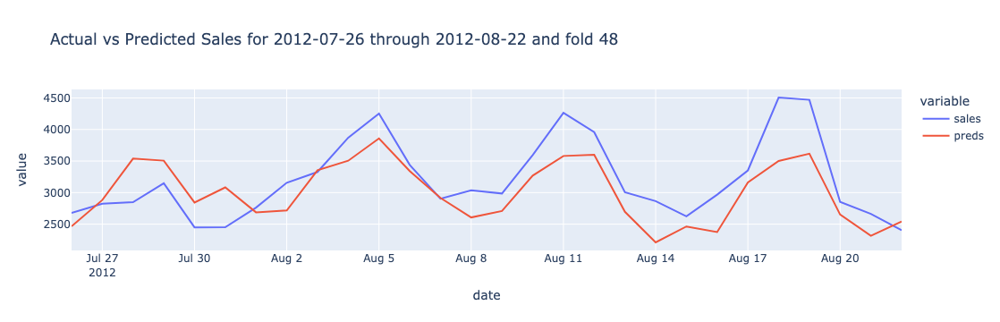

Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


Index(['date', 'sales', 'preds', 'fold'], dtype='object')


In [79]:
for i in df_list[::2]:  #Just show every other plot, otherwise it will show all 183 plots
    #Make plots of each 
    df = i
    print(df.columns)
    date_min = df['date'].min()
    date_max = df['date'].max()
    fold = df['fold'].values[0]
    chart_dates = str(date_min + ' through ' + date_max)
    fig = px.line(df, x='date', y=['sales', 'preds'], title=f"Actual vs Predicted Sales for {chart_dates} and fold {fold}")
    fig.show()

In [80]:
results_df[['rmse', 'rmse_baseline']].mean()

rmse             345.096243
rmse_baseline    426.978121
dtype: float64

In [81]:
#Plot a rolling mean of the RMSE to see how it changes based on the number of training samples
results_df['train_samples'] = np.arange(20, len(X), 10)[:-3]
results_df['rolling_mean_samples'] = results_df['train_samples'].rolling(window=10).mean()
results_df['rolling_rmse'] = results_df['rmse'].rolling(window=10).mean()

results_df

,rmse,rmse_baseline,fold,mean_sales,train_samples,rolling_mean_samples,rolling_rmse
0,347.728853,330.073314,0,2074.071429,20,NaN,NaN
1,435.890302,411.482077,1,1993.500000,30,NaN,NaN
2,387.510234,407.485802,2,1962.607143,40,NaN,NaN
3,254.665368,296.887304,3,1966.678571,50,NaN,NaN
4,196.320693,284.306864,4,1987.464286,60,NaN,NaN
5,200.008778,297.106523,5,2052.571429,70,NaN,NaN
6,227.667008,317.301738,6,2120.714286,80,NaN,NaN
7,260.710898,323.744167,7,2202.535714,90,NaN,NaN
8,272.143894,282.521428,8,2175.642857,100,NaN,NaN
9,241.657264,271.909846,9,2173.250000,110,65.0,282.430329


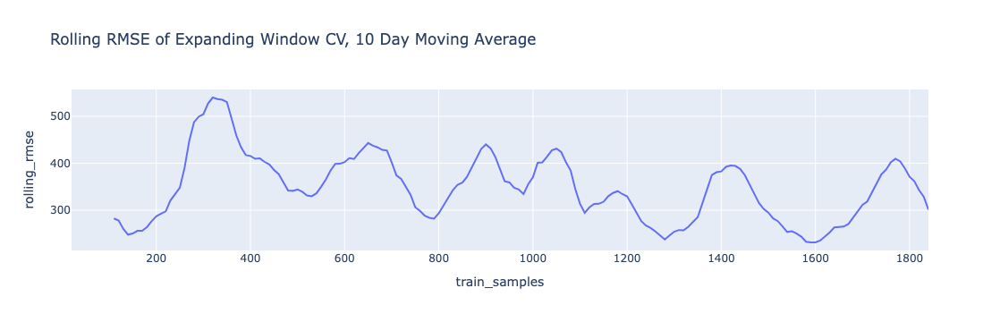

In [82]:
fig = px.line(results_df, x='train_samples', y='rolling_rmse', title='Rolling RMSE of Expanding Window CV, 10 Day Moving Average')

fig.show()


This is interesting as it seems to show that there is kind of an inflection point with regard to the training window size. Right around a 1100 train samples 
seems to be the inflection point, where the pre/post means (< 1100 and > 1100) of RMSE would be quite different. 

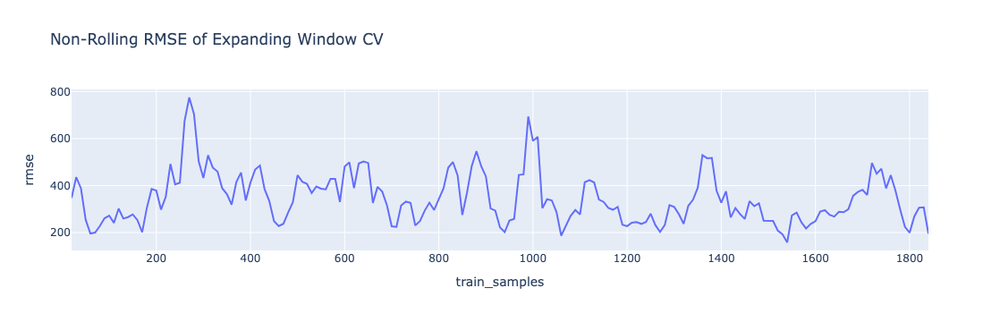

In [83]:
fig = px.line(results_df, x='train_samples', y='rmse', title='Non-Rolling RMSE of Expanding Window CV')

fig.show()

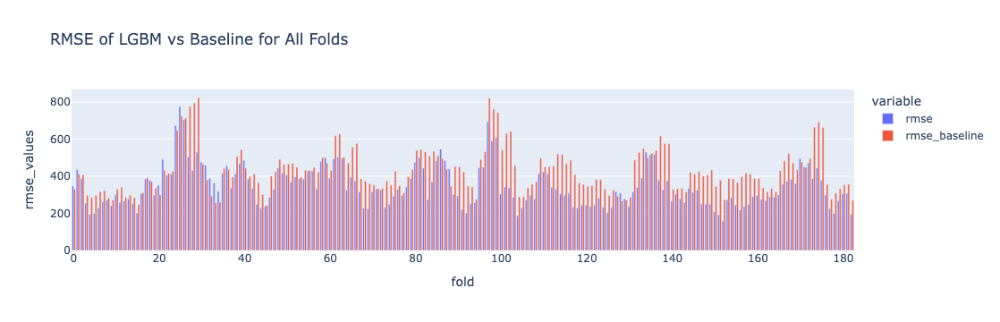

In [84]:
results_df_fig = pd.melt(results_df, id_vars='fold', value_vars=['rmse', 'rmse_baseline'], value_name='rmse_values')

fig = px.bar(results_df_fig, x='fold', y='rmse_values', color='variable', barmode='group', title='RMSE of LGBM vs Baseline for All Folds')

fig.show()

If we want to do grid search, the code below allows us to do that to find the best model params.  And we are being sure to feed the 
CV splits from above to GridSearchCV as well.  

In [266]:
#Prep the folds data to be used in cv so we can use grid search
train_indices = []
test_indices = []

for i, (train, test) in enumerate(folds):
    train_indices.append(list(train))
    test_indices.append(list(test))

In [267]:
def custom_cv_split(train_index, test_index):
    for f_train, f_test in zip(train_indices, test_indices):
        yield f_train, f_test


In [ ]:
param_grid = {'n_estimators':[500, 1000],
                'learning_rate':[.01, .1],
                'min_child_samples':[5, 10, 15, 20], #This is important to tune to better improve test set performance and avoid over-fitting
                'feature_fraction':[.2, .5, .8] #This also could play an important role in avoiding over-fitting so want to get this right
}

model = lgb.LGBMRegressor(metric='rmse')

#Define the scoring metric as RMSE
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

#Didn't know this was a function in sklearn but it is.  
rmse_scorer = make_scorer(rmse, greater_is_better=False)

clf = GridSearchCV(model, param_grid, scoring=rmse_scorer, cv=custom_cv_split(train_indices, test_indices))

X = X[feature_cols]

clf.fit(X, y)

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 164
[LightGBM] [Info] Number of data points in the train set: 70, number of used features: 25
[LightGBM] [Info] Start training from score 2141.257143
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

In [199]:
df_cv_results = pd.DataFrame(clf.cv_results_)
df_cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_feature_fraction,param_learning_rate,param_min_child_samples,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,split10_test_score,split11_test_score,split12_test_score,split13_test_score,split14_test_score,split15_test_score,split16_test_score,split17_test_score,split18_test_score,split19_test_score,split20_test_score,split21_test_score,split22_test_score,split23_test_score,split24_test_score,split25_test_score,mean_test_score,std_test_score,rank_test_score
0,0.086267,0.033197,0.003515,0.000642,0.2,0.01,5,500,"{'feature_fraction': 0.2, 'learning_rate': 0.0...",-226.861277,-231.840353,-415.324338,-699.971873,-380.052376,-412.370888,-361.217264,-306.498880,-349.805293,-441.413659,-294.211714,-506.042309,-494.746849,-498.029310,-421.069900,-443.980486,-421.591914,-390.642447,-279.799764,-469.223678,-460.805376,-274.484863,-438.509164,-335.497124,-566.471863,-362.045833,-403.173415,103.901968,8
1,0.170010,0.027028,0.004873,0.001872,0.2,0.01,5,1000,"{'feature_fraction': 0.2, 'learning_rate': 0.0...",-224.487061,-234.194634,-402.694838,-713.476366,-390.802800,-408.588198,-378.874917,-281.162711,-355.152409,-426.888731,-310.470440,-514.031822,-481.448576,-498.382320,-410.074204,-436.587378,-425.537363,-354.271438,-268.642082,-487.806211,-492.089246,-278.687428,-430.371507,-322.766099,-569.113682,-339.521408,-401.389379,107.918003,6
2,0.070952,0.022943,0.004323,0.001699,0.2,0.01,10,500,"{'feature_fraction': 0.2, 'learning_rate': 0.0...",-191.092749,-221.901176,-411.242032,-728.216431,-389.665327,-396.855647,-287.551428,-287.076030,-353.805891,-428.128370,-261.416711,-446.964362,-458.172592,-555.616186,-412.039943,-447.341232,-412.281567,-404.835062,-278.895635,-421.470563,-410.328493,-261.536426,-393.126724,-312.052056,-563.827423,-360.738507,-388.314560,112.701564,2
3,0.117426,0.009468,0.004837,0.001102,0.2,0.01,10,1000,"{'feature_fraction': 0.2, 'learning_rate': 0.0...",-164.781807,-226.904256,-414.885783,-769.676931,-391.887799,-408.110796,-278.163778,-248.716810,-359.011589,-427.185599,-278.421231,-431.891309,-432.078125,-572.762712,-385.828760,-433.906326,-419.234078,-355.149661,-286.276097,-428.728791,-429.610168,-265.724050,-377.872291,-315.944551,-547.407510,-343.780818,-384.382370,119.554979,1
4,0.053276,0.013704,0.003680,0.000625,0.2,0.01,15,500,"{'feature_fraction': 0.2, 'learning_rate': 0.0...",-296.633861,-293.575492,-550.344971,-670.555533,-489.622464,-545.258223,-381.746694,-474.752227,-381.681660,-458.606592,-351.065959,-519.606647,-621.322184,-711.120443,-583.263800,-531.614924,-509.238207,-602.176148,-425.536607,-538.877895,-538.037637,-333.673629,-557.586170,-476.007591,-584.712672,-479.139532,-496.375299,106.649349,39
5,0.094940,0.009486,0.004108,0.000870,0.2,0.01,15,1000,"{'feature_fraction': 0.2, 'learning_rate': 0.0...",-260.147626,-310.437634,-529.780301,-697.034550,-405.521881,-497.590236,-353.028134,-383.352124,-352.112071,-442.304208,-295.183114,-457.149935,-526.597235,-628.889273,-519.410506,-500.205542,-545.616124,-521.021663,-351.110139,-484.810959,-548.092403,-319.572519,-507.331129,-437.602438,-553.128447,-415.015294,-455.463288,104.918219,31
6,0.048069,0.006880,0.003923,0.000575,0.2,0.01,20,500,"{'feature_fraction': 0.2, 'learning_rate': 0.0...",-310.113771,-297.660492,-541.266753,-662.500126,-420.394154,-541.622816,-361.674487,-461.764879,-460.940406,-464.451754,-350.957530,-529.840192,-634.302129,-652.045684,-606.642177,-591.299123,-500.884333,-587.928574,-480.332240,-543.846615,-534.447979,-364.682407,-527.534587,-531.887189,-603.088853,-530.070286,-503.545367,100.584431,43
7,0.101477,0.046092,0.004083,0.000576,0.2,0.01,20,1000,"{'feature_fraction': 0.2, 'learning_rate': 0.0...",-270.411562,-299.283944,-512.179485,-683.154150,-392.307526,-521.590890,-343.410633,-358.992597,-429.4486

In [200]:
df_cv_results[df_cv_results['rank_test_score']==1]

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_feature_fraction,param_learning_rate,param_min_child_samples,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,split10_test_score,split11_test_score,split12_test_score,split13_test_score,split14_test_score,split15_test_score,split16_test_score,split17_test_score,split18_test_score,split19_test_score,split20_test_score,split21_test_score,split22_test_score,split23_test_score,split24_test_score,split25_test_score,mean_test_score,std_test_score,rank_test_score
3,0.117426,0.009468,0.004837,0.001102,0.2,0.01,10,1000,"{'feature_fraction': 0.2, 'learning_rate': 0.0...",-164.781807,-226.904256,-414.885783,-769.676931,-391.887799,-408.110796,-278.163778,-248.71681,-359.011589,-427.185599,-278.421231,-431.891309,-432.078125,-572.762712,-385.82876,-433.906326,-419.234078,-355.149661,-286.276097,-428.728791,-429.610168,-265.72405,-377.872291,-315.944551,-547.40751,-343.780818,-384.38237,119.554979,1


In [201]:
clf.best_estimator_

LGBMRegressor(feature_fraction=0.2, learning_rate=0.01, metric='rmse',
              min_child_samples=10, n_estimators=1000)

So right now, the model does beat the baseline model where we just use the previous 28 days values as the next 28 days future sales values.  There are still a couple things we could modify in the LGBM model though to improve performance.  I didn't actually end up running grid search with the expanding window folds because I think it would take too much memory on my computer but would definitely be worth doing with more compute resources.  It might further improve performance of the model.